# Taller 1

Visión por computador con enfoque en inteligencia artificial

Sección 1

Integrantes: Benjamín García-Huidobro y José Castillo

In [6]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
#imágenes a trabajar
blur_link="taller/blur.tif"
house_link="taller/house.tif"
nouse_link="taller/noise1.tif"
race_link="taller/race.tif"
#leer imágenes
blur=cv2.imread(blur_link, cv2.IMREAD_GRAYSCALE)
house=cv2.imread(house_link, cv2.IMREAD_GRAYSCALE)
noise=cv2.imread(nouse_link, cv2.IMREAD_GRAYSCALE)
race=cv2.imread(race_link, cv2.IMREAD_GRAYSCALE)




## 1.	Subir el brillo en una imagen en escala de grises y mostrar el histograma. Explicar.

Crearemos una función, la cual tendra como parámetros la imagen, la intensidad y el título. Para aumentar el brillo se le sumarán a cada pixel de la imagen para aumentar la intensidad.
Además, cada imagen tendrá su histograma para ver los cambios efectuados.

In [12]:
def show_img_brillos(imagen, intencidad, title):
    plt.figure(figsize=(15, 10))  # Tamaño de la imagen

    plt.subplot(2, 2, 1)
    plt.imshow(imagen, cmap="gray")
    plt.axis("off")
    plt.title('Imagen Original')

    plt.subplot(2, 2, 2)
    histg = cv2.calcHist([imagen], [0], None, [256], [0, 256])
    plt.plot(histg)
    plt.title('Histograma Imagen Original')

    # Crear la imagen con brillo aumentado
    imagen_brillo = imagen + intencidad

    # Mostrar la imagen con brillo aumentado con uint8
    imagen_brillo_uint8 = np.clip(imagen + intencidad, 0, 255).astype(np.uint8)
    histg_brillo__uint8 = cv2.calcHist([imagen_brillo], [0], None, [256], [0, 256])
    plt.subplot(2, 2, 3)
    plt.imshow(imagen_brillo_uint8, cmap="gray")
    plt.axis("off")
    plt.title('Imagen con Brillo uint8')

    # Calcular y mostrar el histograma de la imagen con brillo aumentado con uint8
    plt.subplot(2, 2, 4)
    plt.plot(histg_brillo__uint8)
    plt.title('Histograma con Brillo')



    plt.suptitle(title)
    plt.show()



Llamamos a la función para cada imagen, con la intensidad a sumar y el título de la agrupación.

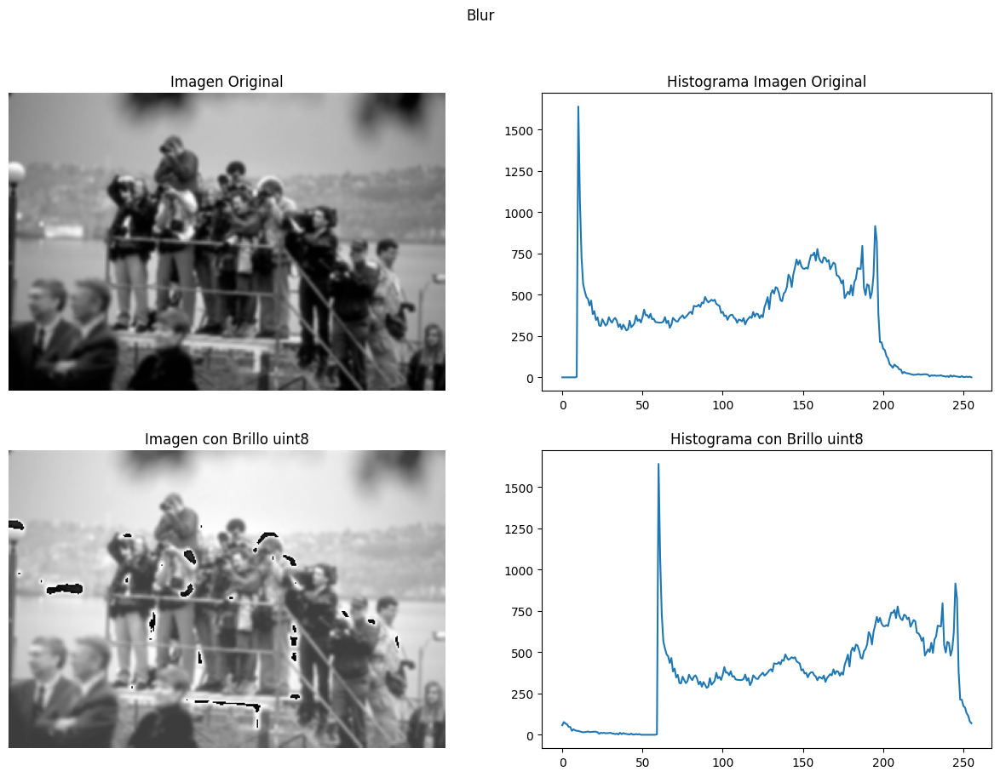

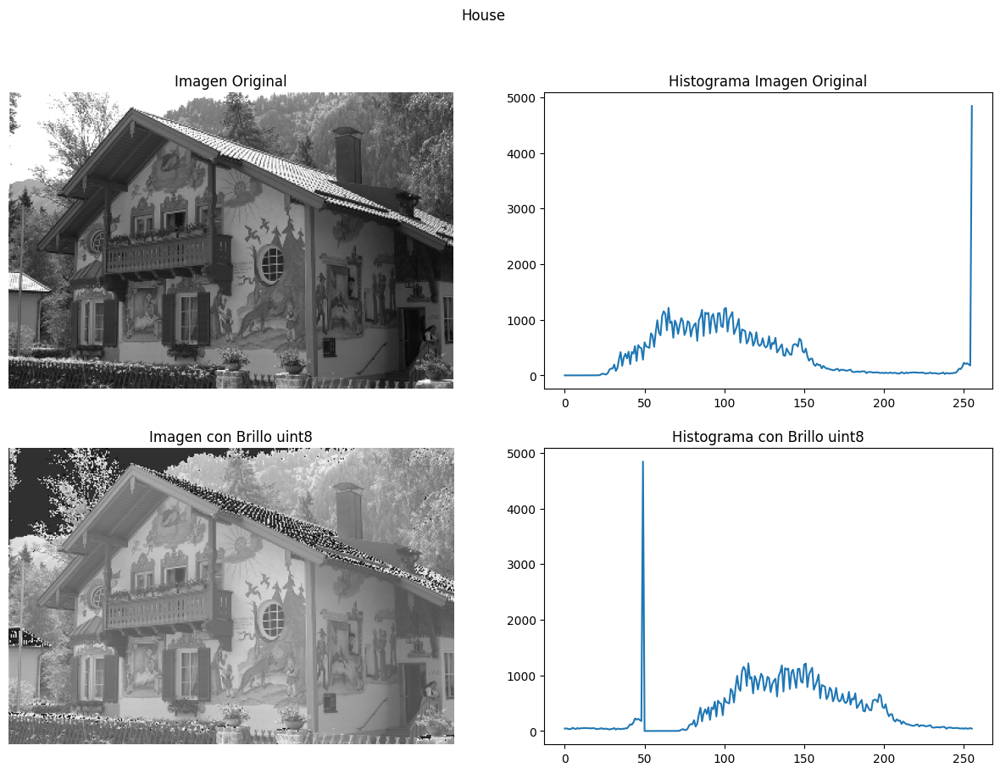

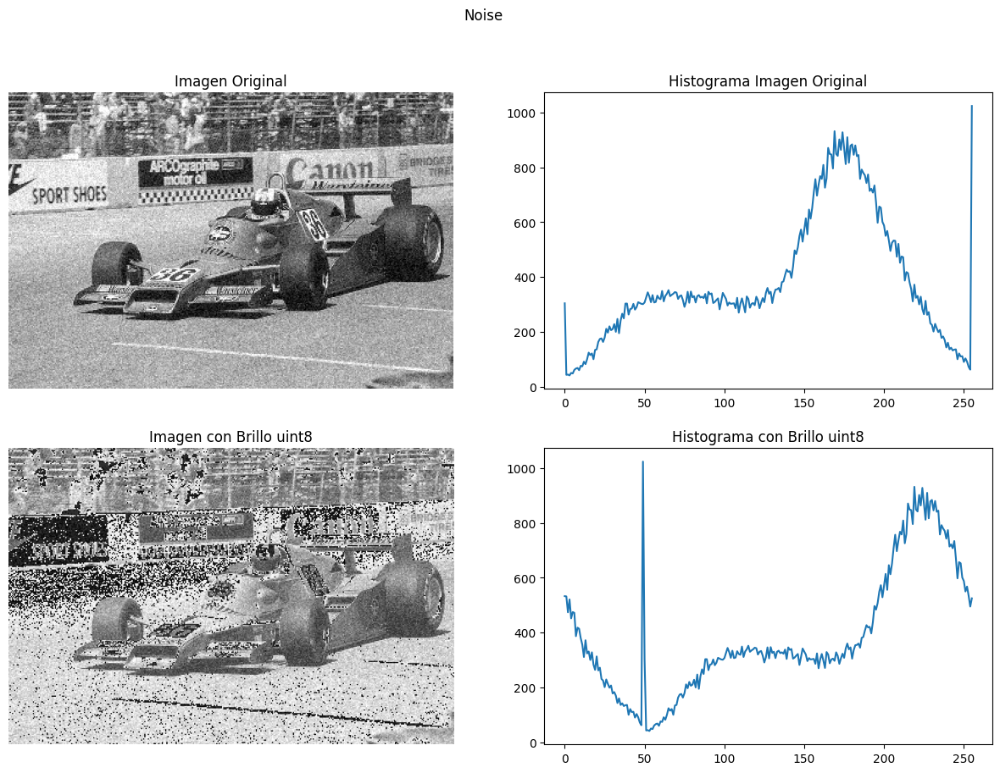

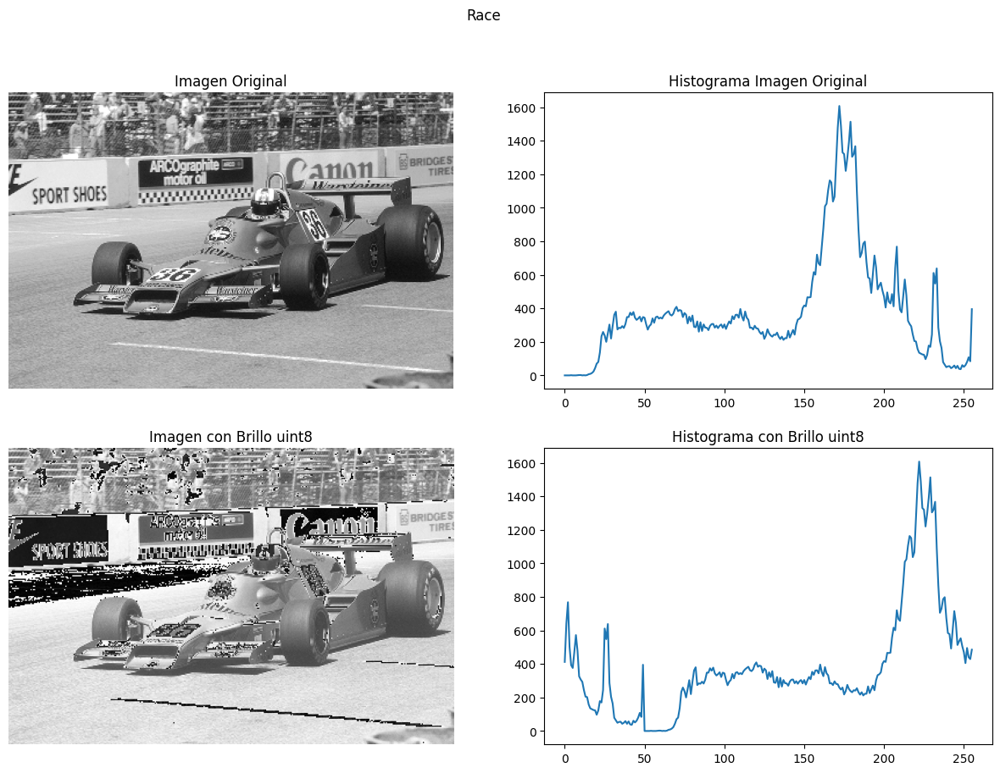

In [11]:
show_img_brillos(blur,50,"Blur")
show_img_brillos(house,50,"House")
show_img_brillos(noise,50,"Noise")
show_img_brillos(race,50,"Race")

En General podemos notar que los histogramas se movilizan hacia la derecha, gracias al aumento de intensidad en los píxeles, ademas que en todas las fotos , el brillo aumento, pero en algunos casos tambien ven areas en negro. 
- blur :  En el caso de esta image  se aprecia que en algunas zonas blancas se quedaron unos pixeles de color negro.
- House : Se ve que se aclaro la imagen en general, pero en algunas zonas se ve muy drastico la imagen, en algunas zonas se coloco solo el color negro, por en el caso del tejado y del techo
- noise : En este caso la imagen venia con ruido, por lo que al aumenatr el brillo,la mayoria de los prixeles llegaron a sobrepasar la 255 , quedando muchos puntos negro.
- race : La imagen no tiene ruido, pero tiene pixeles(en la zona de la izquida), que al aumentar la intensidad sobrepase los 255 , dando unos pixeles en negro.

## 2.	Bajar el brillo en una imagen en escala de grises y mostrar el histograma.Explicar.


Crearemos otra función, la cual tendra los mismos parámetros de imagen, intensidad y título. Para bajar el brillo se le restarán a cada pixel de la imagen para disminuir la intensidad.
Además, cada imagen tendrá su histograma para ver los cambios efectuados.

In [43]:
def show_img_oscura(imagen, intencidad, title):
    plt.figure(figsize=(15, 10))  # Tamaño de la imagen
    # Mostrar la imagen original
    plt.subplot(2, 2, 1)
    plt.imshow(imagen, cmap="gray")
    plt.axis("off")
    plt.title('Imagen Original')
    # Calcular y mostrar el histograma de la imagen original
    plt.subplot(2, 2, 2)
    histg = cv2.calcHist([imagen], [0], None, [256], [0, 256])
    plt.plot(histg)
    plt.title('Histograma Imagen Original')

    # Crear la imagen con brillo aumentado
    imagen_brillo = np.clip(imagen - intencidad, 0, 255).astype(np.uint8)

    # Mostrar la imagen con brillo aumentado
    plt.subplot(2, 2, 3)
    plt.imshow(imagen_brillo, cmap="gray")
    plt.axis("off")
    plt.title('Imagen con Brillo disminuido')

    # Calcular y mostrar el histograma de la imagen con brillo aumentado
    # Mostrar la imagen con brillo disminuido con uint8
    histg_brillo = cv2.calcHist([imagen_brillo], [0], None, [256], [0, 256])
    plt.subplot(2, 2, 4)
    plt.plot(histg_brillo)
    plt.title('Histograma con menos Brillo')
    # Mostrar la imagen con brillo disminuido con uint8
    plt.suptitle(title)
    plt.show()


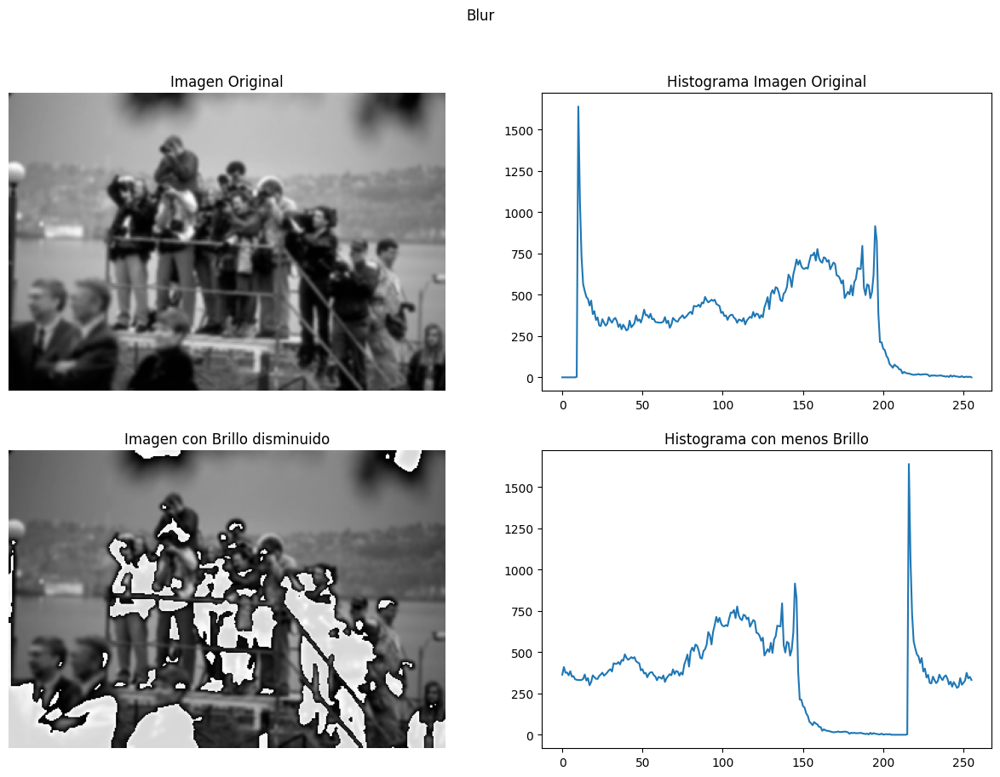

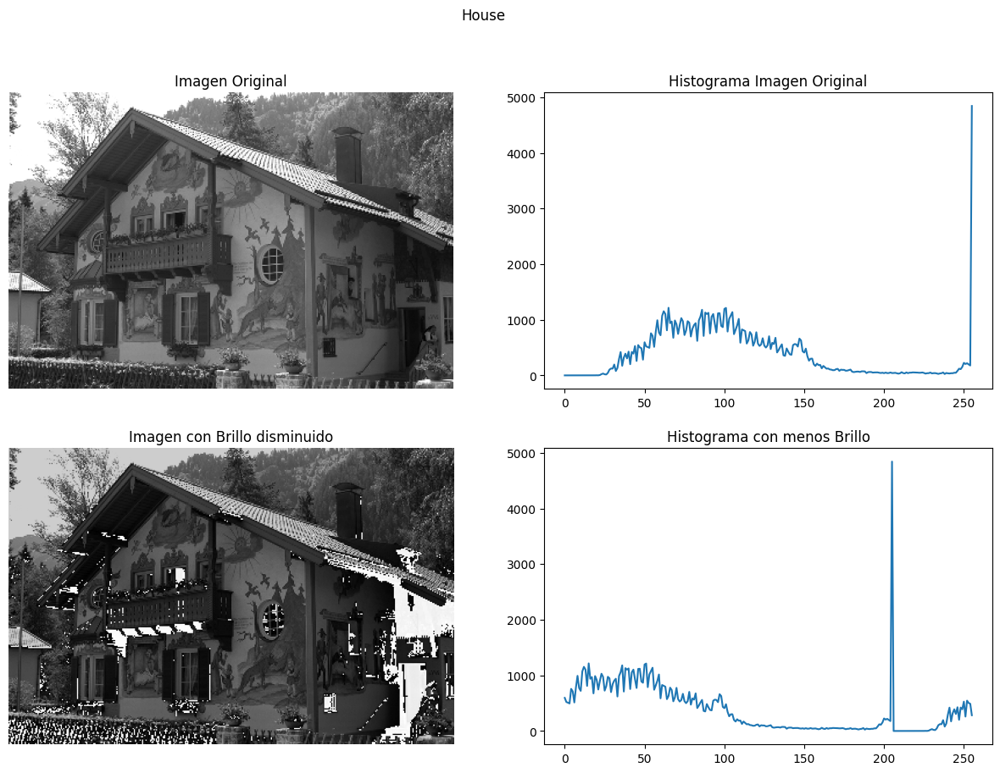

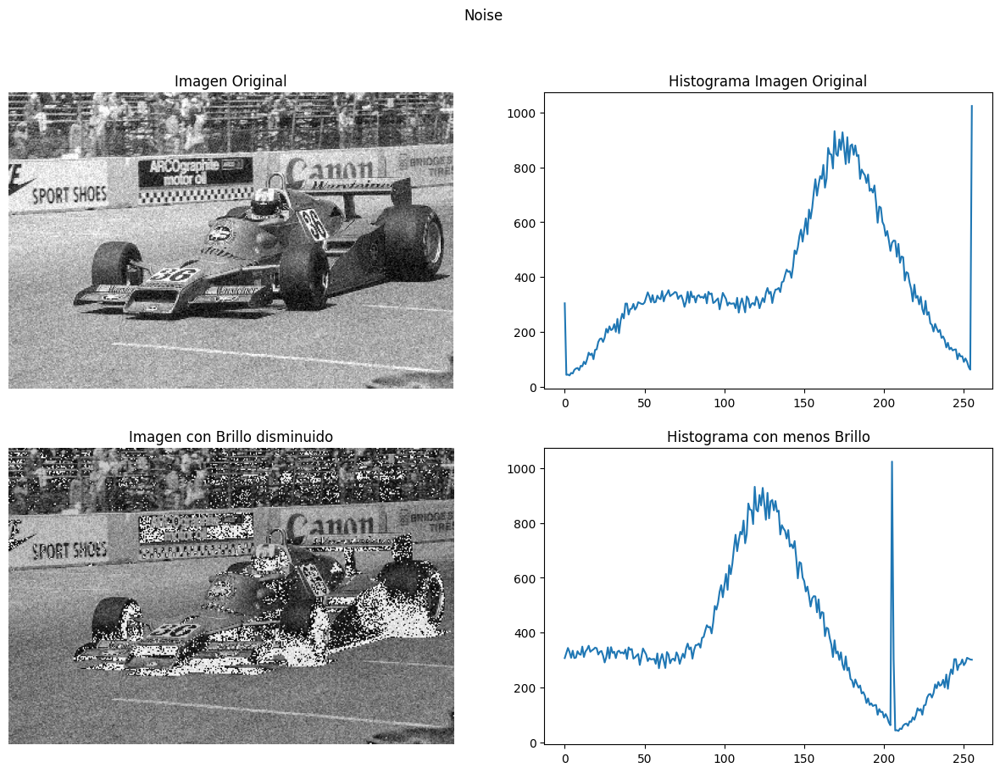

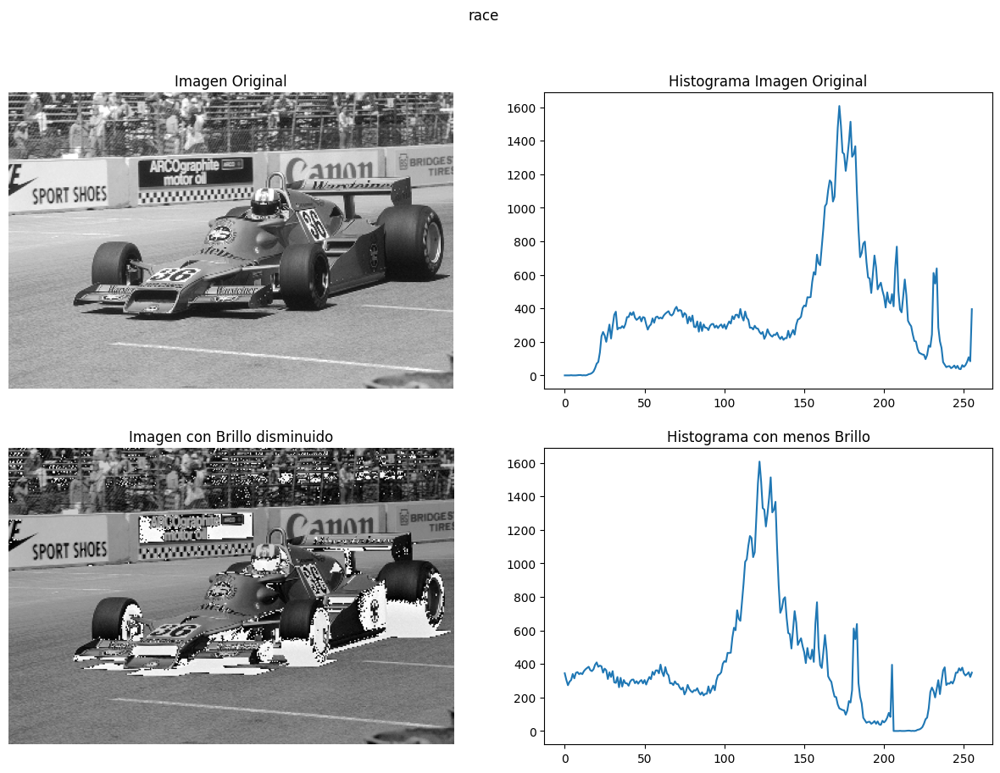

In [44]:
show_img_oscura(blur,50,"Blur")
show_img_oscura(house,50,"House")
show_img_oscura(noise,50,"Noise")
show_img_oscura(race,50,"race")

En el caso general al igual que en la pregunta 1 los histogramas se desplazan, pero en este caso hacia la izquierda al restar intensidad a las imágenes, 

- blur :  En esta caso  no se aprecia una disminución de la intencidad, ademas que se presentan areas blancas ,dado que los pixeles cernaos a 0 al restaslos , pasan a valer 255 o un   valor menor pero cercano.
- House : Se ve que la imagen se ve oscura en general, presenta que en algunos puntos blancos  dado que paso algo similar a la imagen de "Blur"
- noise : En este caso,la imagen venia con ruido, por lo que al disminuir el brillo,la mayoria de los prixeles llegaron  a ser negativos pero con on uint8 , se soluciona , pero genera que los valores negativos pasen a ser valores cercanos a 255
- race : La imagen no tiene ruido, pero tiene pixeles(en la zona de las ruedas), que al disminuir la intensidad, dejandolos en negativos, se termina genera que los valores negativos pasen a ser valores cercanos a 255,

## 3.	Repetir puntos 1 y 2 para una imagen de color (usar histograma de cada canal en RGB).

Ahora aumentaremos y disminuiremos el brillo de nuestra nueva imagen a color, y podremos ver los histogramas con los 3 canales RGB.

Creamos una función que toma una imagen en formato BGR, ajusta el brillo de cada canal de color por separado y devuelve los canales modificados como tres matrices separadas, lo que permite aplicar diferentes transformaciones de brillo a cada canal de color individualmente.

In [38]:
# Función para modificar el brillo por canal
def modificar_brillo_por_Canal(imagen, intencidad):
    blue, green, red = cv2.split(imagen) #subdividimos en 3 canales en matrices separadas
    blue_brillo_uint8 = np.clip(blue + intencidad, 0, 255).astype(np.uint8)
    green_brillo_uint8 = np.clip(green + intencidad, 0, 255).astype(np.uint8)
    red_brillo_uint8 = np.clip(red + intencidad, 0, 255).astype(np.uint8) #sumamos intensidades
    return blue_brillo_uint8, green_brillo_uint8, red_brillo_uint8

    

Definimos nuestra imagen y llamamos a la función con diferentes intensidades para subir y bajar el nivel de brillo.

Creamos los histogramas con los diferentes niveles de rojo, azul y verde.

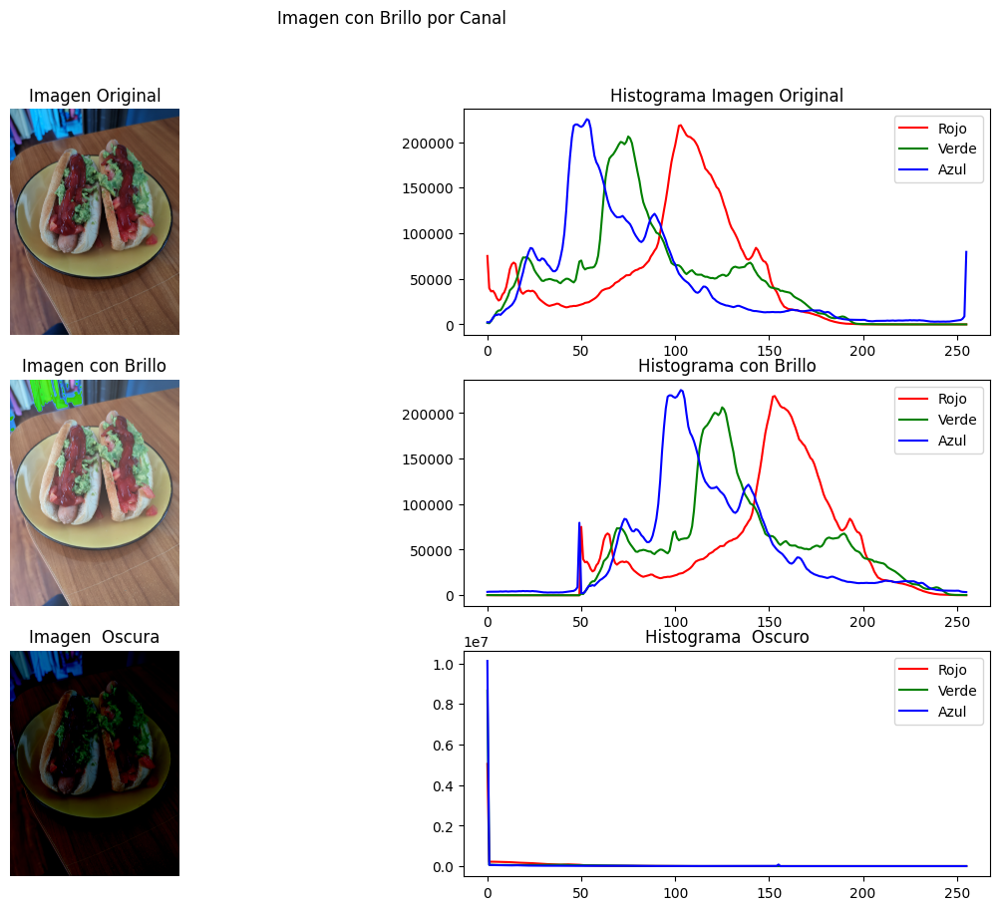

In [37]:
# Leer imagen
img = cv2.imread("taller/CompletoSupremo.jpg")
# Separar canales
blue, green, red = cv2.split(img)
# Modificar brillo por canal
blue_brillo, green_brillo, red_brillo = modificar_brillo_por_Canal(img, 50)
blue_oscuro, green_oscuro, red_oscuro = modificar_brillo_por_Canal(img, -100)

# Calcular histogramas
hist_blue=cv2.calcHist([blue], [0], None, [256], [0, 256])
hist_green=cv2.calcHist([green], [0], None, [256], [0, 256])
hist_red=cv2.calcHist([red], [0], None, [256], [0, 256])

hist_blue_brillo=cv2.calcHist([blue_brillo], [0], None, [256], [0, 256])
hist_green_brillo=cv2.calcHist([green_brillo], [0], None, [256], [0, 256])
hist_red_brillo=cv2.calcHist([red_brillo], [0], None, [256], [0, 256])

hist_blue_oscuro=cv2.calcHist([blue_oscuro], [0], None, [256], [0, 256])
hist_green_oscuro=cv2.calcHist([green_oscuro], [0], None, [256], [0, 256])
hist_red_oscuro=cv2.calcHist([red_oscuro], [0], None, [256], [0, 256])



# Modificar brillo por canal
blue_brillo, green_brillo, red_brillo = modificar_brillo_por_Canal(img, 50)
blue_oscuro, green_oscuro, red_oscuro = modificar_brillo_por_Canal(img, -100)

# Calcular histogramas
hist_blue = cv2.calcHist([blue], [0], None, [256], [0, 256])
hist_green = cv2.calcHist([green], [0], None, [256], [0, 256])
hist_red = cv2.calcHist([red], [0], None, [256], [0, 256])

hist_blue_brillo = cv2.calcHist([blue_brillo], [0], None, [256], [0, 256])
hist_green_brillo = cv2.calcHist([green_brillo], [0], None, [256], [0, 256])
hist_red_brillo = cv2.calcHist([red_brillo], [0], None, [256], [0, 256])

hist_blue_oscuro = cv2.calcHist([blue_oscuro], [0], None, [256], [0, 256])
hist_green_oscuro = cv2.calcHist([green_oscuro], [0], None, [256], [0, 256])
hist_red_oscuro = cv2.calcHist([red_oscuro], [0], None, [256], [0, 256])

# Visualizar resultados
plt.figure(figsize=(15, 10))  # Tamaño de la imagen

# Imagen Original y Histograma
plt.subplot(3, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title('Imagen Original')

plt.subplot(3, 2, 2)
plt.plot(hist_red, color='red', label='Rojo')
plt.plot(hist_green, color='green', label='Verde')
plt.plot(hist_blue, color='blue', label='Azul')
plt.title('Histograma Imagen Original')
plt.legend()

# Imagen con Brillo y Histograma
plt.subplot(3, 2, 3)
plt.imshow(cv2.cvtColor(cv2.merge([red_brillo, green_brillo, blue_brillo]), cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title('Imagen con Brillo')

plt.subplot(3, 2, 4)
plt.plot(hist_red_brillo, color='red', label='Rojo')
plt.plot(hist_green_brillo, color='green', label='Verde')
plt.plot(hist_blue_brillo, color='blue', label='Azul')
plt.title('Histograma con Brillo')
plt.legend()

# Imagen con Brillo Oscuro y Histograma
plt.subplot(3, 2, 5)
plt.imshow(cv2.cvtColor(cv2.merge([red_oscuro, green_oscuro, blue_oscuro]), cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title('Imagen Oscura')

plt.subplot(3, 2, 6)
plt.plot(hist_red_oscuro, color='red', label='Rojo')
plt.plot(hist_green_oscuro, color='green', label='Verde')
plt.plot(hist_blue_oscuro, color='blue', label='Azul')
plt.title('Histograma Oscuro')
plt.legend()

plt.suptitle("Imagen con Brillo por Canal")
plt.show()


- Imagen con brillo : Se puede ver que en los 3 canales aumento el brillo (Desplazamiento a la derecha del histograma),pero  a diferencia de las imagenes en escala de grises, se ve que nunca se supera los 255, daod que no an una dominancia de un color sobre el otro.
- Imagen Oscura :  Se puede ver que en los 3 canales disminuido  la intenciadad (Desplazamiento a la izquierda del histograma), a diferencia de los casos anteriores, la imagen se ve que no hay colores más intensos que otros, pero en el histograma se ve que la intencidad son cercanos a 0 en todos los canales.

## 4.	Subir el contraste en una imagen y mostrar el histograma. Explicar.
- Referencia : https://docs.opencv.org/4.x/d3/dc1/tutorial_basic_linear_transform.html

Creamos una función que aumente el contraste cada imagen utilizando la transformación lineal donde tenemos alpha y beta que tendrán efectos en el contraste y el brillo respectivamente.

In [72]:
import cv2
import matplotlib.pyplot as plt

def show_img_Contraste(imagen, alpha, title):

    # Crear una figura para mostrar la imagen y los histogramas
    plt.figure(figsize=(15, 10))  # Tamaño de la imagen
    
    # Mostrar la imagen original
    plt.subplot(3, 2, 1)
    plt.imshow(imagen, cmap="gray")
    plt.axis("off")
    plt.title('Imagen Original')
    
    # Calcular y mostrar el histograma de la imagen original
    histg = cv2.calcHist([imagen], [0], None, [256], [0, 256])
    plt.subplot(3, 2, 2)
    plt.plot(histg)
    plt.title('Histograma Imagen Original')
    
    # Convertir la imagen a uint8 si no lo es
    imagen_modificada = np.clip(imagen * alpha, 0, 255).astype(np.uint8)
    
    # Mostrar la imagen con contraste ajustado
    plt.subplot(3, 2, 3)
    plt.imshow(imagen_modificada, cmap="gray")
    plt.axis("off")
    plt.title('Imagen con Contraste Ajustado')
    
    # Calcular y mostrar el histograma de la imagen con contraste ajustado
    histg_modificada = cv2.calcHist([imagen_modificada], [0], None, [256], [0, 256])
    plt.subplot(3, 2, 4)
    plt.plot(histg_modificada)
    plt.title('Histograma con Contraste Ajustado')
    
    # Título general para la figura
    plt.suptitle(title)
    
    # Mostrar la figura
    plt.show()



Llamamos a la función para ver los cambios en los contrastes con sus respectivos histogramas. Utilizamos alpha = 1,5 en este caso.

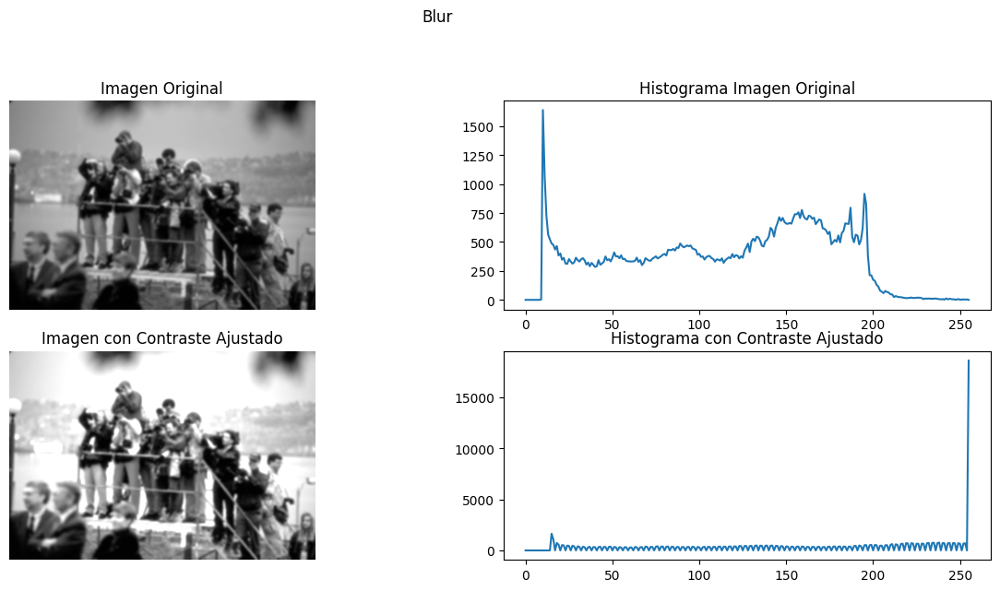

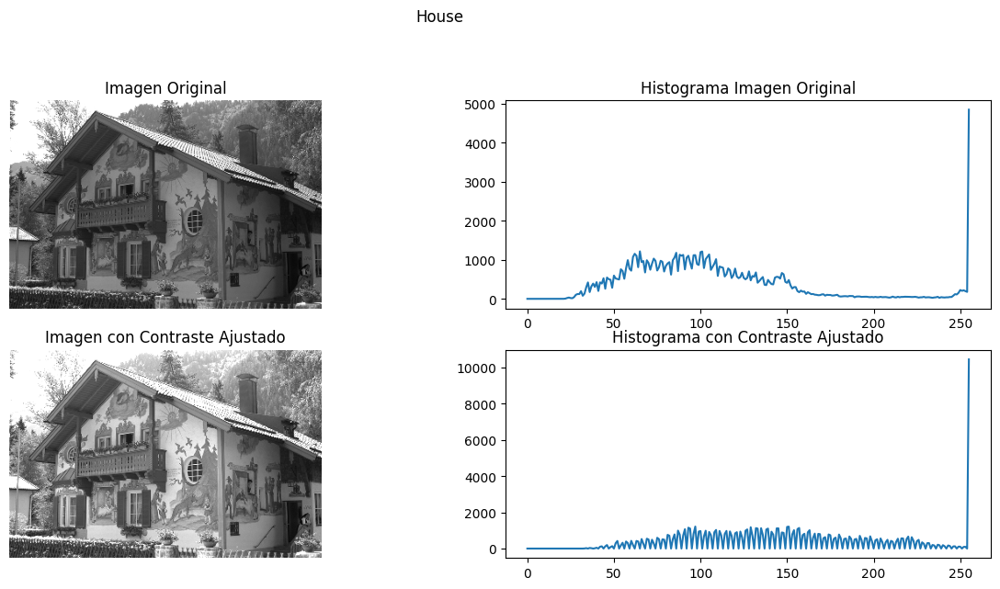

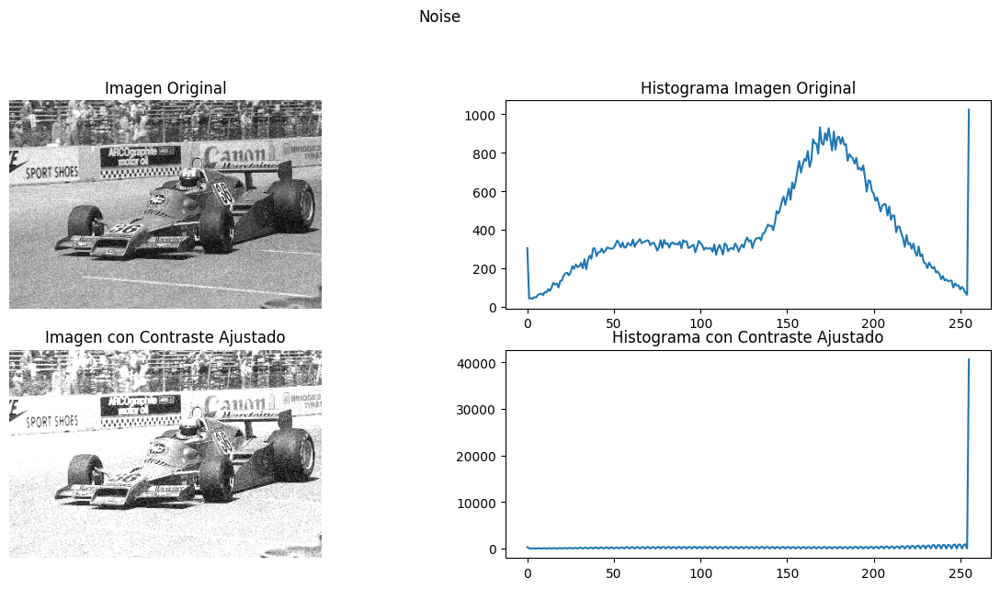

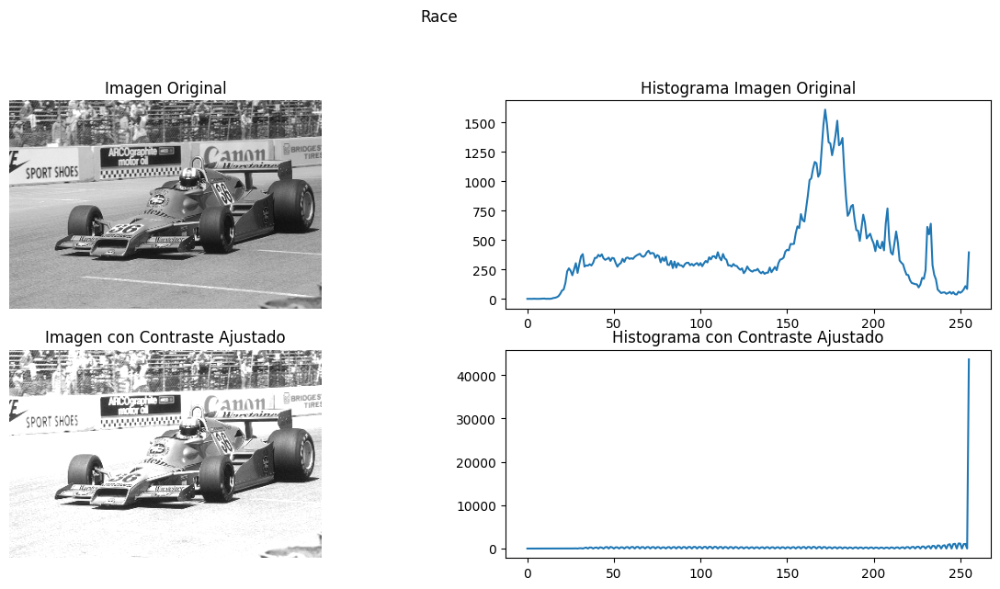

In [73]:
show_img_Contraste(blur,1.5,"Blur")
show_img_Contraste(house,1.5,"House")
show_img_Contraste(noise,1.5,"Noise")
show_img_Contraste(race,1.5,"Race")

Podemos notar que al aumentar el contraste en las imágenes el histograma con aumento se ve contraído comparado con el original.

- blur : Se pierde el contenido que esta al final de la imagen, aunque lo que más adeletan de ella (las personas) aun se distingen más.
- House :  Se pierde el contenido que esta al final de la imagen, en este caso los dibujos que hay en la pared se distingen más.
- noise : Se siente que el auto se ve más,pero se pierden detalles como la demarcacion de la lineas de la pista
- race : Se siente que el auto se ve más (en comporacion a la imagen noise), ademas que de que algunos elementos de los letreros se destacan más.

## 5.	Bajar el contraste en una imagen y mostrar el histograma. Explicar.

Utilizamos la misma función pero esta vez con un nivel de contraste menor. 

In [74]:
def show_img_Contraste(imagen, alpha, title):
    plt.figure(figsize=(15, 10))  # Tamaño de la imagen
    plt.subplot(3, 2, 1)
    plt.imshow(imagen, cmap="gray")
    plt.axis("off")
    plt.title('Imagen Original')

    plt.subplot(3, 2, 2)
    histg = cv2.calcHist([imagen], [0], None, [256], [0, 256])
    plt.plot(histg)
    plt.title('Histograma Imagen Original')

    # Convertir la imagen a uint8 si no lo es
    imagen_modificada = np.clip(imagen * alpha, 0, 255).astype(np.uint8)

    # Mostrar la imagen con brillo aumentado
    plt.subplot(3, 2, 3)
    plt.imshow(imagen_modificada, cmap="gray")
    plt.axis("off")
    plt.title('Imagen con menor Contraste ')

    # Calcular y mostrar el histograma de la imagen con brillo aumentado
    histg_modificada = cv2.calcHist([imagen_modificada], [0], None, [256], [0, 256])
    plt.subplot(3, 2, 4)
    plt.plot(histg_modificada)
    plt.title('Histograma con menor Contraste')


    plt.suptitle(title)
    plt.show()


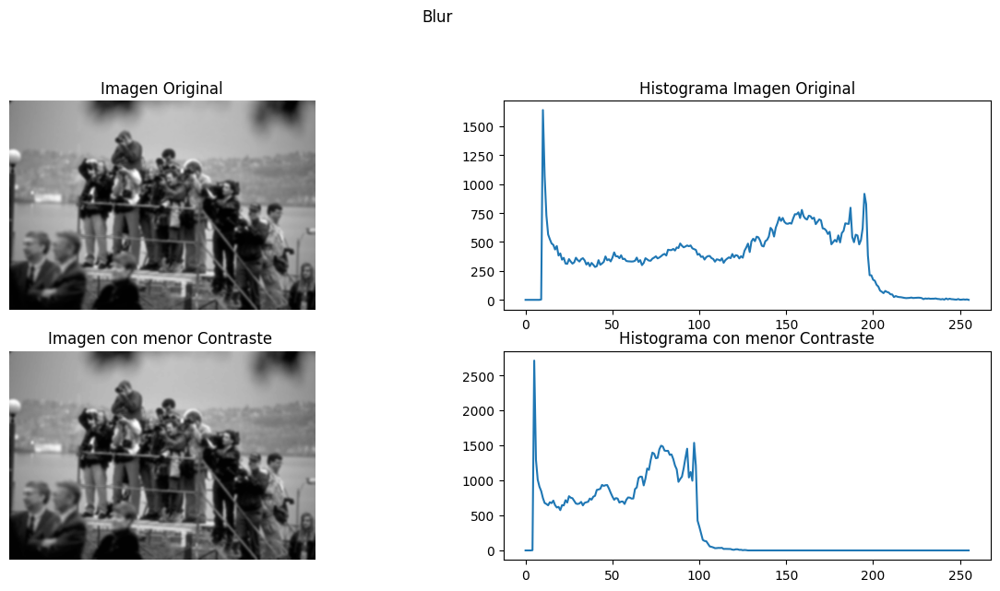

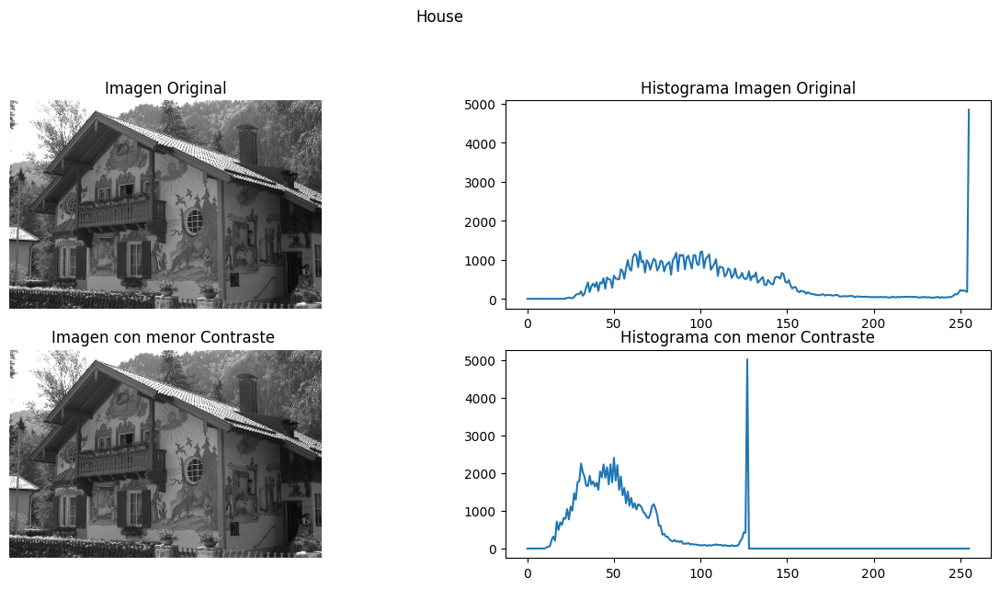

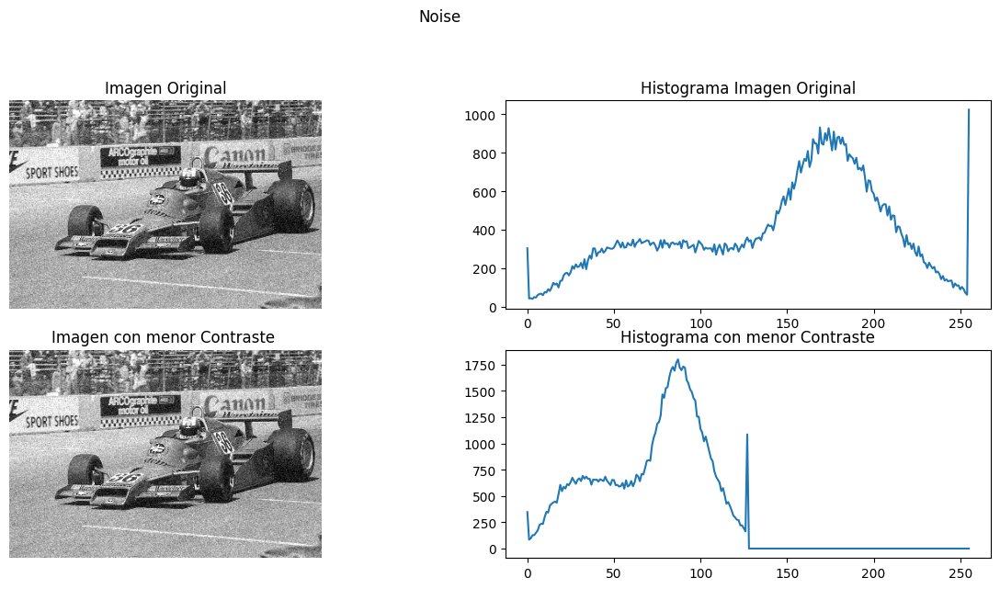

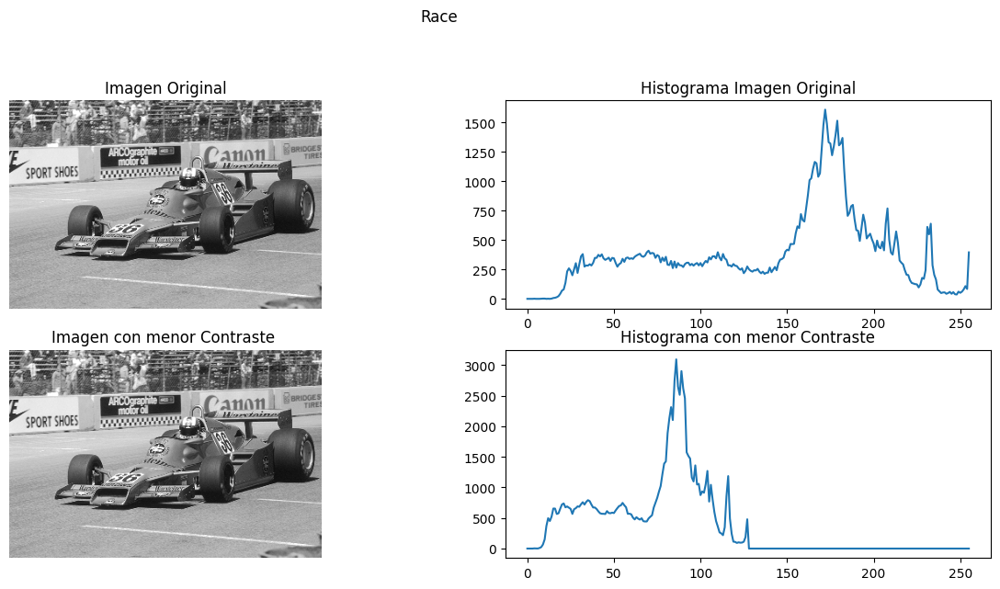

In [75]:
show_img_Contraste(blur,0.5,"Blur")
show_img_Contraste(house,0.5,"House")
show_img_Contraste(noise,0.5,"Noise")
show_img_Contraste(race,0.5,"Race")

En general los histogramas de cada imagen se contraen

- blur : Se distingue el contenido que esta al final de la imagen y el contenido de lo que esta más adeletan de ella (las personas) tambien se distingue.
- House : Se distingue el contenido y los detaller de la casa
- noise : El ruido dismuinuyo un poco, peor los detalles de la imagen se mantienen.
- race : Se distingue el contenido y los detaller de auto

Como que en general la images no tuvo mucho impacto al reducir el contraste

## 6.	Repetir puntos 4 y 5 para una imagen de color (usar histograma de cada canal en RGB).

In [81]:
# Definición de la función para modificar el contraste por canal
def modifica_contraste_por_Canal(imagen, alpha):
    # Separar los canales de color de la imagen en azul, verde y rojo
    blue, green, red = cv2.split(imagen)
    
    # Aplicar el aumento de contraste a cada canal
    # Asegurar que los valores estén dentro del rango válido para uint8 (0-255)
    blue_contraste = np.clip(blue * alpha, 0, 255).astype(np.uint8)
    green_contraste = np.clip(green * alpha, 0, 255).astype(np.uint8)
    red_contraste = np.clip(red * alpha, 0, 255).astype(np.uint8)
    
    # Devolver los canales de color modificados
    return blue_contraste, green_contraste, red_contraste


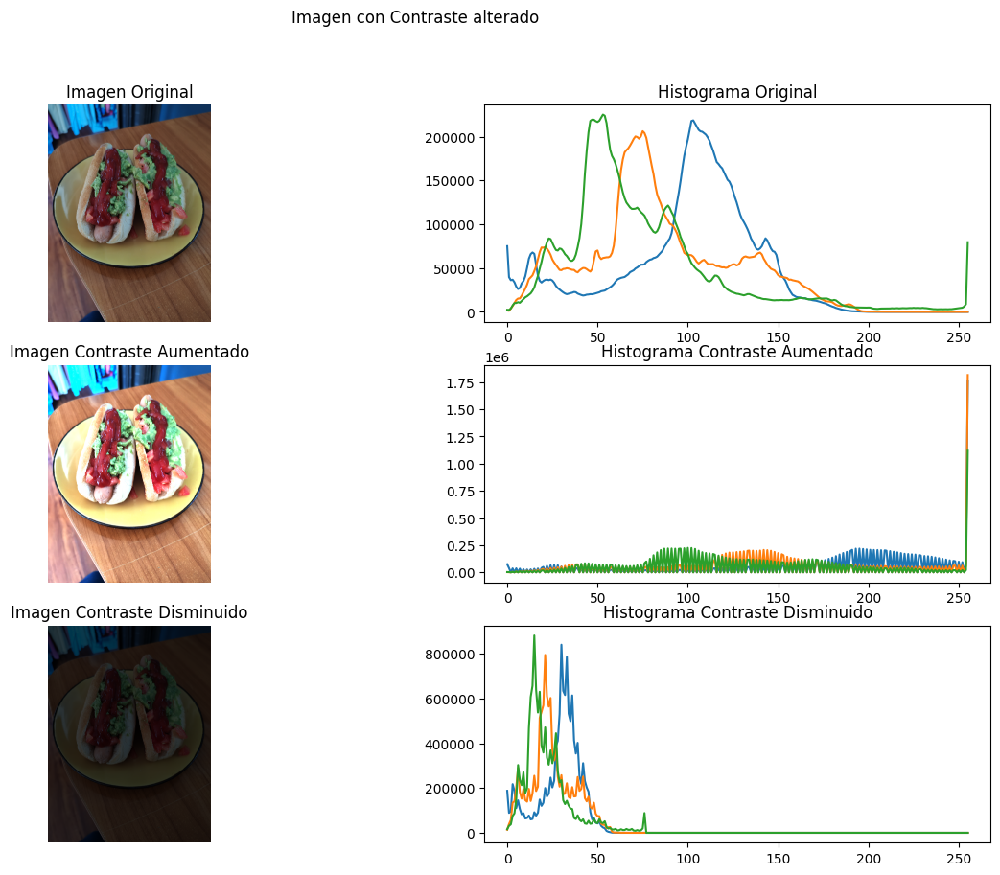

In [82]:
# Leer imagen
img = cv2.imread("taller/CompletoSupremo.jpg")
# Separar canales
blue, green, red = cv2.split(img)
# Modificar contraste por canal
blue_alto_contaste, green_alto_contaste, red_alto_contaste = modifica_contraste_por_Canal(img, 1.9)
blue_bajo_contaste, green_bajo_contaste, red_bajo_contaste = modifica_contraste_por_Canal(img, 0.3)

# Calcular histogramas
hist_blue=cv2.calcHist([blue], [0], None, [256], [0, 256])
hist_green=cv2.calcHist([green], [0], None, [256], [0, 256])
hist_red=cv2.calcHist([red], [0], None, [256], [0, 256])

hist_blue_alto_contaste=cv2.calcHist([blue_alto_contaste], [0], None, [256], [0, 256])
hist_green_alto_contaste=cv2.calcHist([green_alto_contaste], [0], None, [256], [0, 256])
hist_red_alto_contaste=cv2.calcHist([red_alto_contaste], [0], None, [256], [0, 256])

hist_blue_bajo_contaste=cv2.calcHist([blue_bajo_contaste], [0], None, [256], [0, 256])
hist_green_bajo_contaste=cv2.calcHist([green_bajo_contaste], [0], None, [256], [0, 256])
hist_red_bajo_contaste=cv2.calcHist([red_bajo_contaste], [0], None, [256], [0, 256])
# Visualizar resultados
plt.figure(figsize=(15, 10))  # Tamaño de la imagen
# Imagen Original y Histograma
plt.subplot(3, 2, 1)
plt.imshow(cv2.merge([red, green, blue]))
plt.axis("off")
plt.title('Imagen Original')

plt.subplot(3, 2, 2)
plt.plot(hist_red)
plt.plot(hist_green)
plt.plot(hist_blue)
plt.title('Histograma Original')

# Imagen con Contraste y Histograma
plt.subplot(3, 2, 3)
plt.imshow(cv2.merge([red_alto_contaste,green_alto_contaste,blue_alto_contaste]))
plt.axis("off")
plt.title('Imagen Contraste Aumentado')

plt.subplot(3, 2, 4)
plt.plot(hist_red_alto_contaste)
plt.plot(hist_green_alto_contaste)
plt.plot(hist_blue_alto_contaste)
plt.title('Histograma Contraste Aumentado')
# Imagen con Contraste 2 y Histograma 2
plt.subplot(3, 2, 5)
plt.imshow(cv2.merge([red_bajo_contaste,green_bajo_contaste,blue_bajo_contaste]))
plt.axis("off")
plt.title('Imagen Contraste Disminuido')

plt.subplot(3, 2, 6)
plt.plot(hist_red_bajo_contaste)
plt.plot(hist_green_bajo_contaste)
plt.plot(hist_blue_bajo_contaste)
plt.title('Histograma Contraste Disminuido')

plt.suptitle("Imagen con Contraste alterado")
plt.show()







- Imagen con Contraste aumentado: La palta pierde un poco sus linear , ademas que que los poleras de atras pierden detalles, ademas se aumento el brillo del imagen, desaparecen las sombras en el plato. En el histograma los canalas se expande o se estira, direccion a 255.
- Imagen con Contraste disminuido : La imagen pierde un intencidad (brillo), ademas no pierde tantos detalles la poleras del fondo, tambien conserva las sombras en el plato. En el histograma de ve como los canales se contaen en direcion a 0 .


## 7.	Aplicar Binarización de la imagen usando un umbral duro (hard threshold). Probar con 3 tipos de umbral diferente, y mostrar la imagen resultante y su histograma.

In [14]:
def threshold_hard(imagen, umbrales,titulo):
    plt.figure(figsize=(15, 14))
    plt.subplot(4, 2,1)
    plt.imshow(imagen, cmap='gray')
    plt.title('Imagen Original')
    plt.axis('off')

    plt.subplot(4, 2, 2)
    histg = cv2.calcHist([imagen], [0], None, [256], [0, 256])
    plt.plot(histg)
    plt.title('Histograma Original')

    N= 3
    for umbral in umbrales:
        plt.subplot(4, 2, N)
        _, imagen_binaria = cv2.threshold(imagen, umbral, 255, cv2.THRESH_BINARY)
        plt.imshow(imagen_binaria, cmap='gray')
        plt.title(f'Umbral: {umbral}')
        plt.axis('off')

        plt.subplot(4, 2, N+1)    
        histg = cv2.calcHist([imagen_binaria], [0], None, [256], [0, 256])
        plt.plot(histg)
        plt.title(f'Histograma Umbral: {umbral}')
        N+=2

    plt.suptitle(f'Threshold Hard {titulo}')
    plt.show()

    return 0


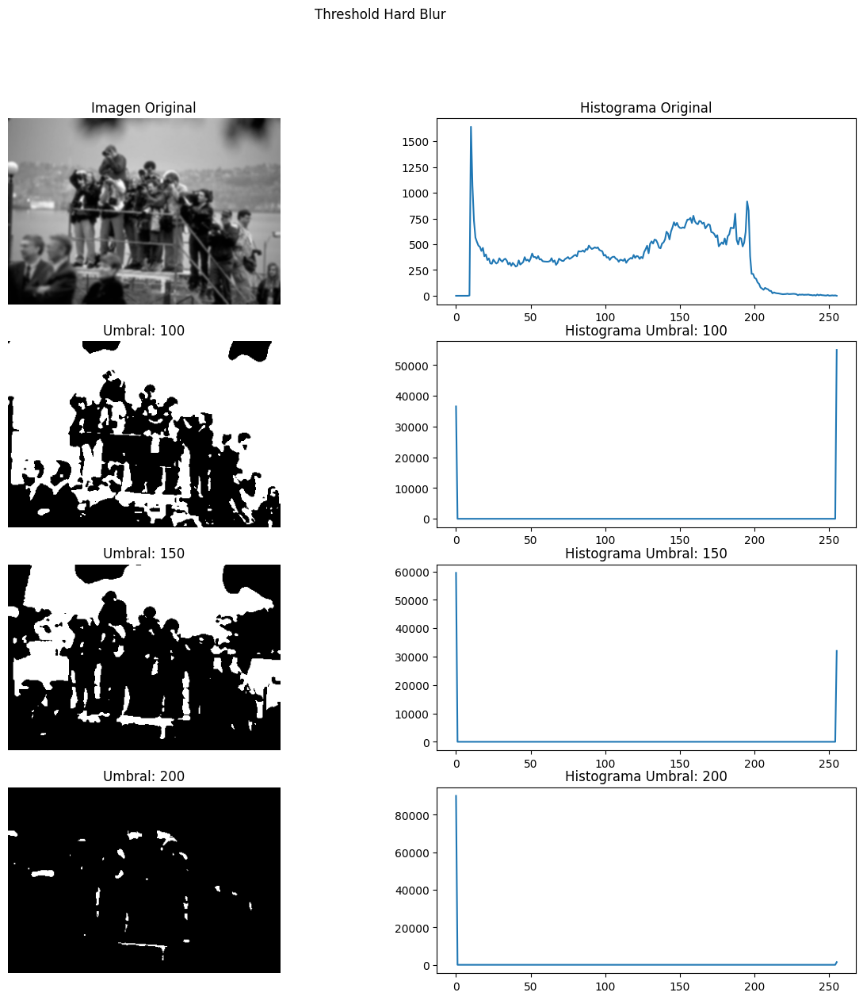

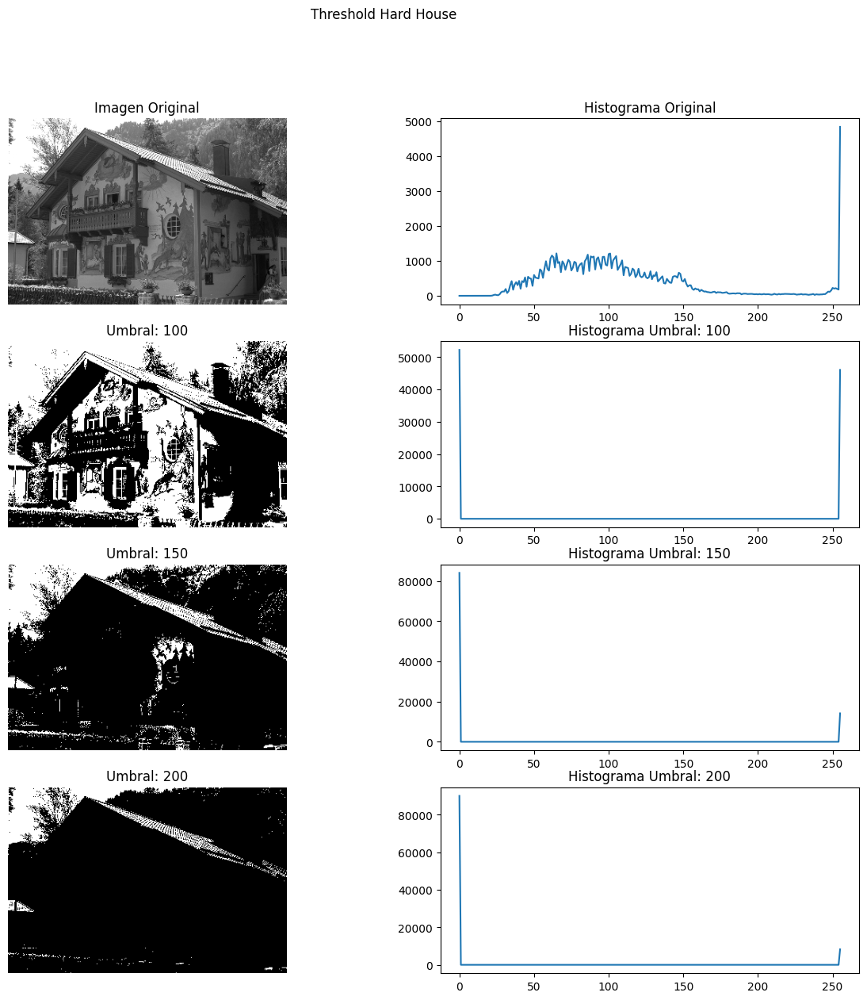

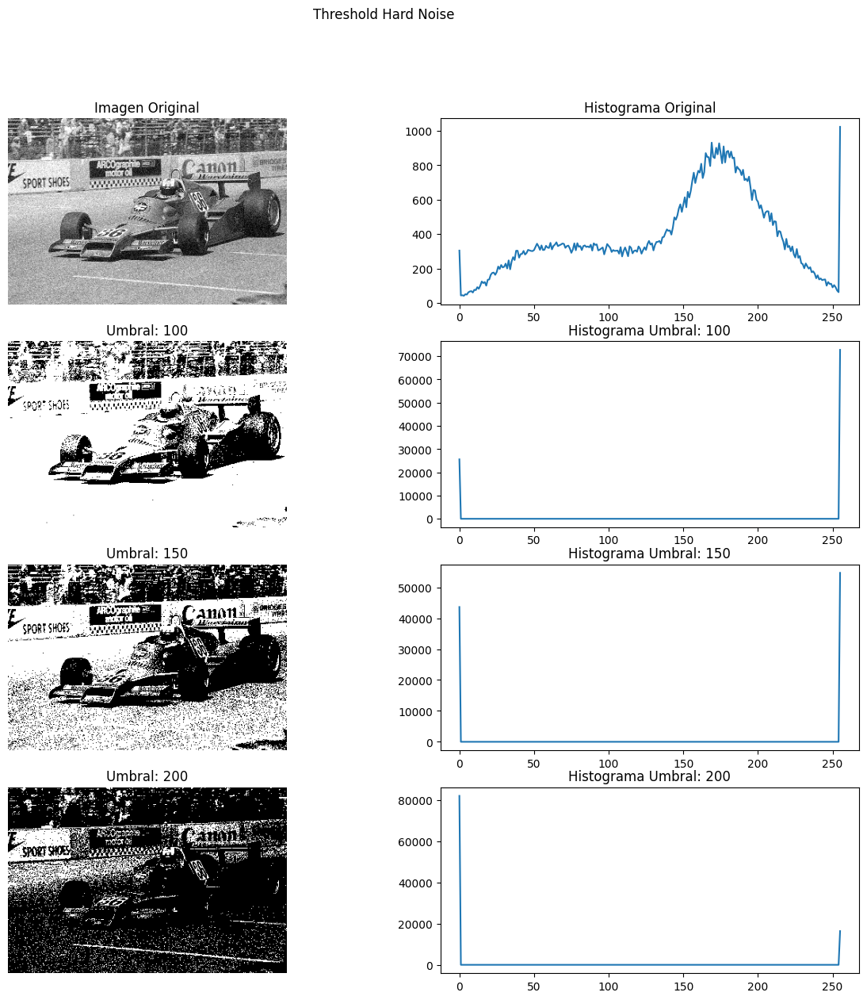

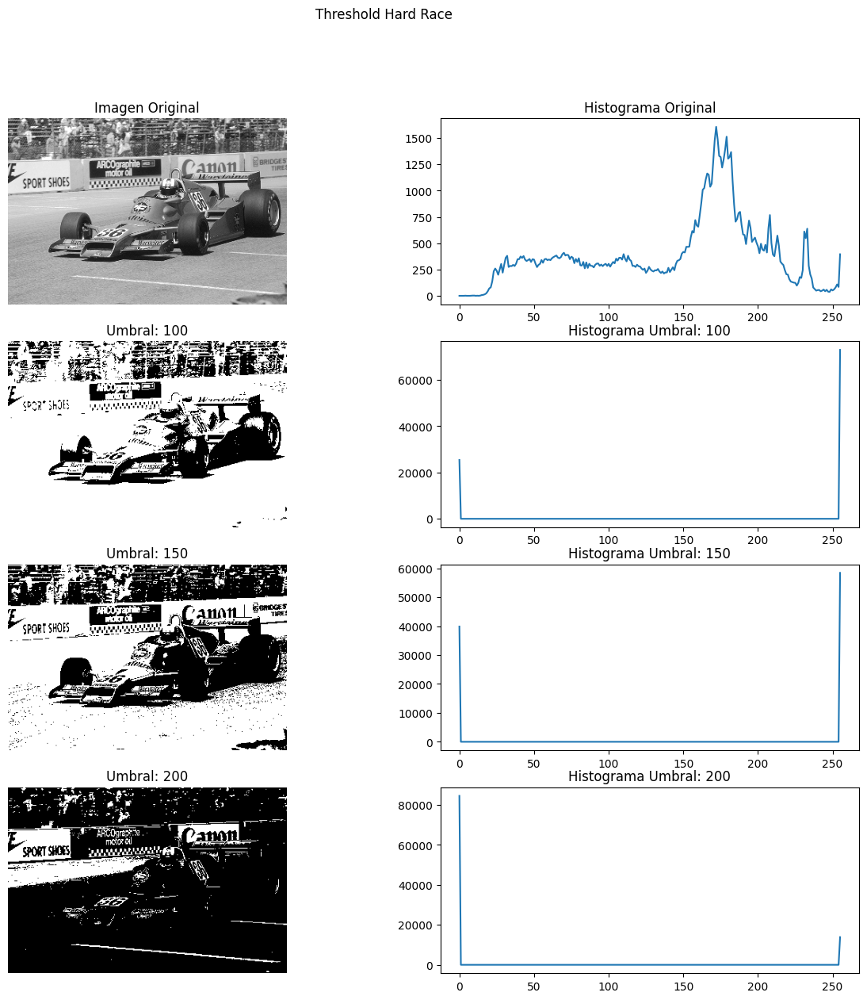

0

In [15]:
umbrales = [100, 150, 200]
threshold_hard(blur, umbrales,"Blur")
threshold_hard(house, umbrales,"House")
threshold_hard(noise, umbrales,"Noise")
threshold_hard(race, umbrales,"Race")

## 8.	Aplicar en una imagen un umbral suave (soft threshold), y mostrar la imagen resultante y su histograma.

In [80]:
def threshold_soft(imagen, umbrales,titulo):
    plt.figure(figsize=(15, 14))
    plt.subplot(4, 2,1)
    plt.imshow(imagen, cmap='gray')
    plt.title('Imagen Original')
    plt.axis('off')

    plt.subplot(4, 2, 2)
    histg = cv2.calcHist([imagen], [0], None, [256], [0, 256])
    plt.plot(histg)
    plt.title('Histograma Original')

    N= 3
    for umbral in umbrales:
        plt.subplot(4, 2, N)
        _, imagen_binaria = cv2.threshold(imagen, umbral, 255, cv2.THRESH_BINARY)
        plt.imshow(imagen_binaria, cmap='gray')
        plt.title(f'Umbral: {umbral}')
        plt.axis('off')

        plt.subplot(4, 2, N+1)    
        histg = cv2.calcHist([imagen_binaria], [0], None, [256], [0, 256])
        plt.plot(histg)
        plt.title(f'Histograma Umbral: {umbral}')
        N+=2

    plt.suptitle(f'Threshold Soft {titulo}')
    plt.show()

    return 0

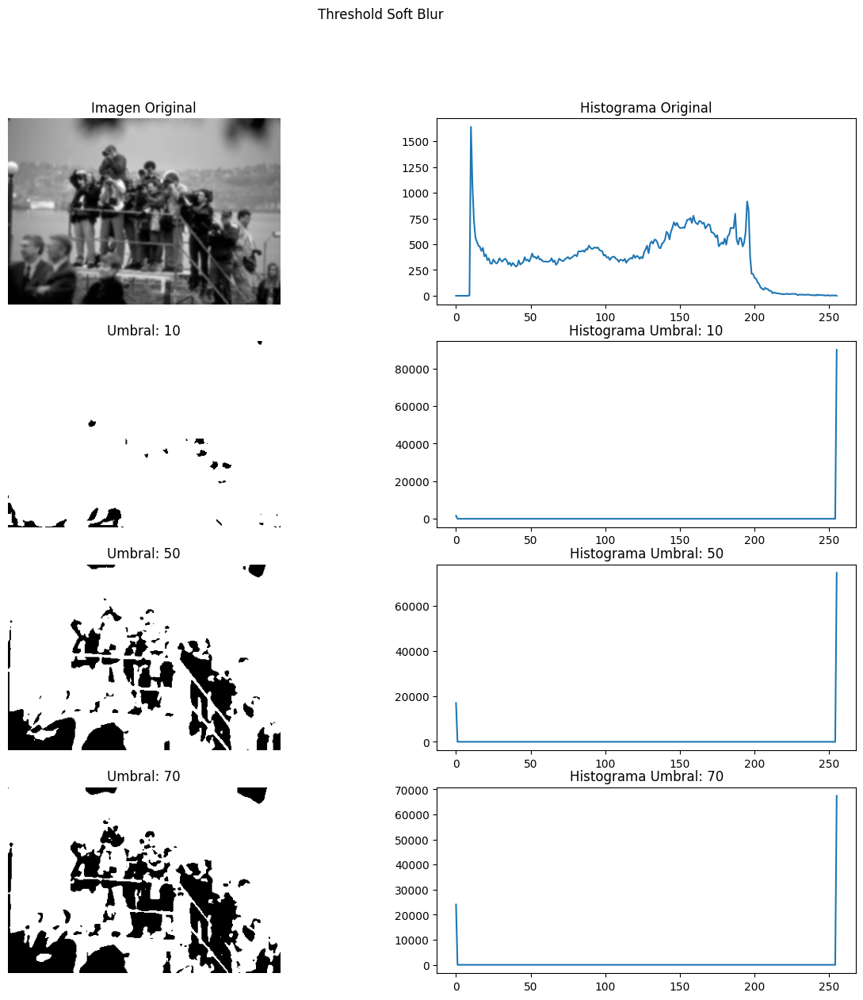

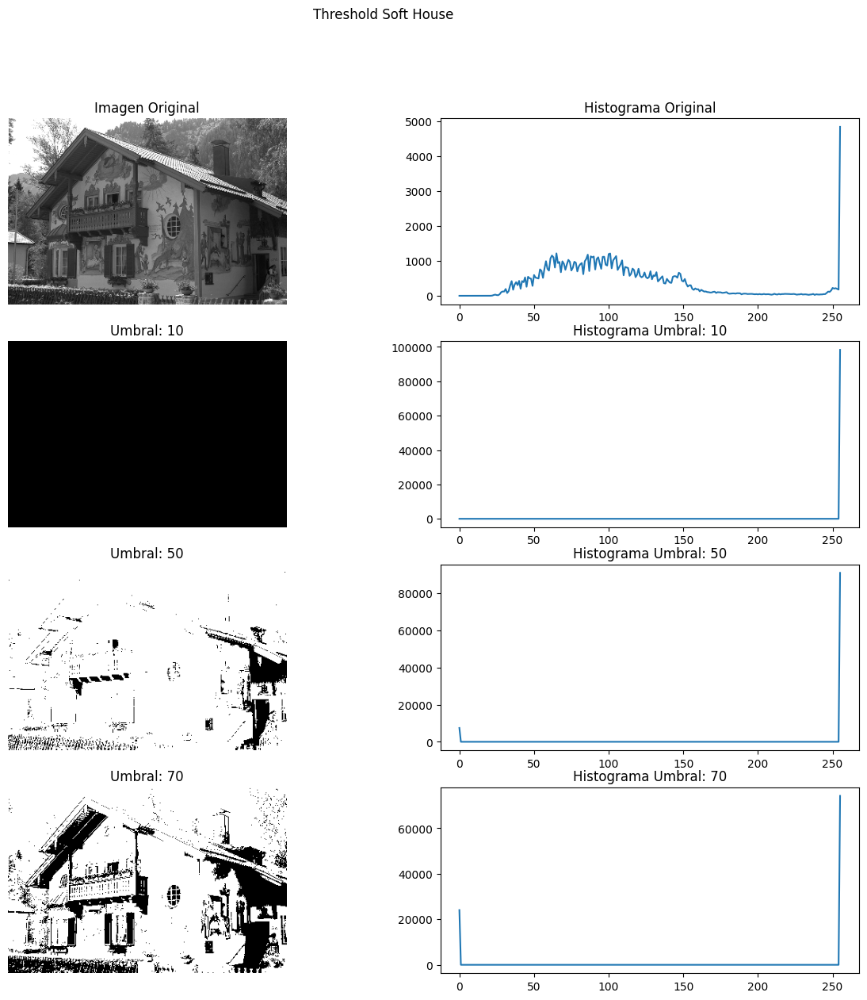

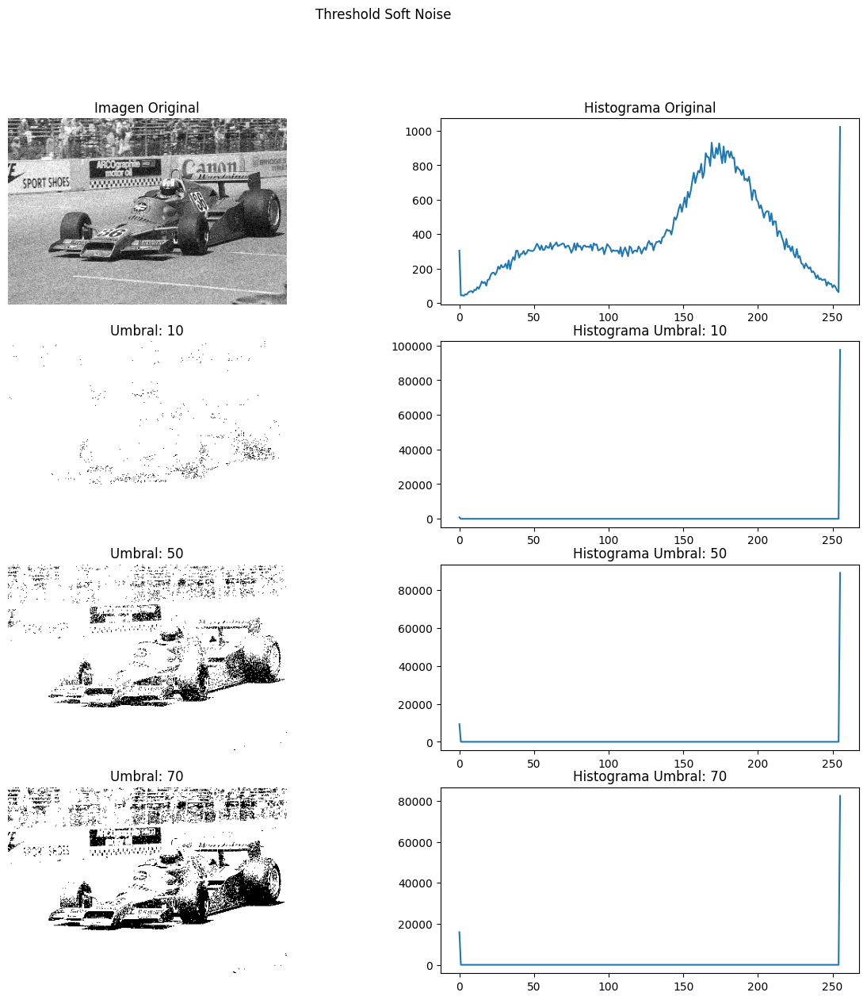

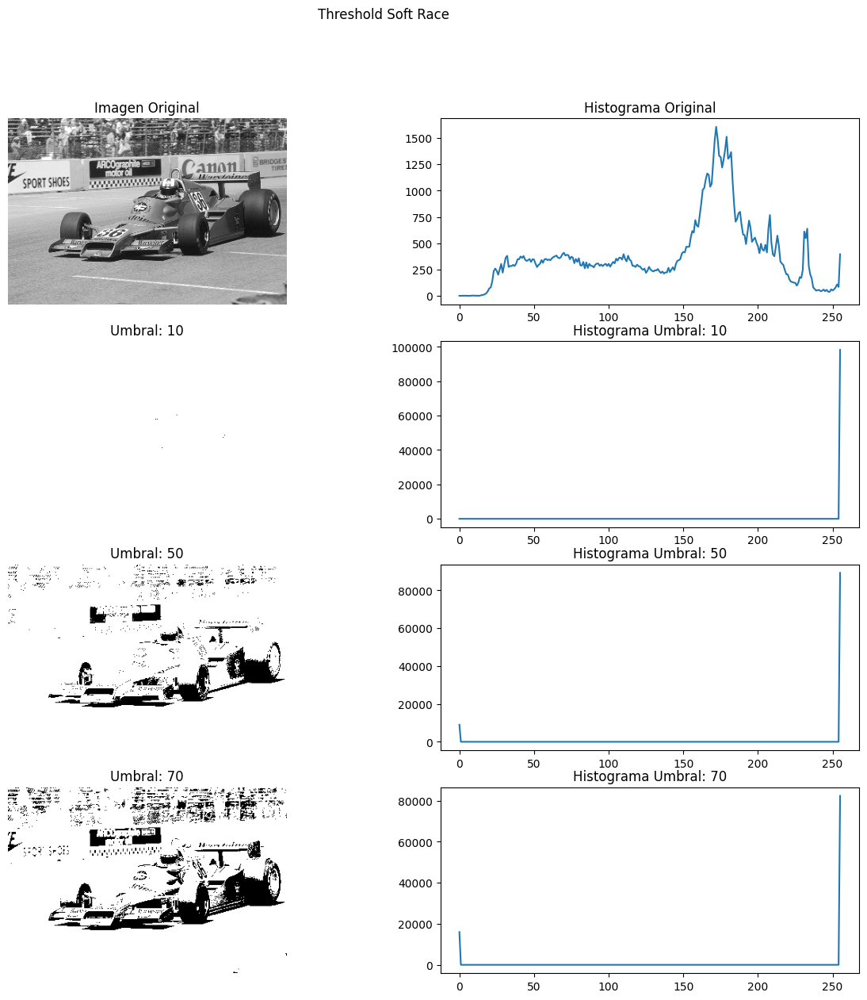

0

In [81]:
umbrales = [10, 50,70 ]
threshold_soft(blur, umbrales,"Blur")
threshold_soft(house, umbrales,"House")
threshold_soft(noise, umbrales,"Noise")
threshold_soft(race, umbrales,"Race")

## 9.	Repetir puntos 7 y 8 para una imagen de color (usar histograma de cada canal en RGB).

In [17]:
def bin_canales_RGB(r, g, b, thresholds):
    _,binary_red = cv2.threshold(r, thresholds, 255, cv2.THRESH_BINARY)
    _,binary_green = cv2.threshold(g, thresholds, 255, cv2.THRESH_BINARY)
    _,binary_blue = cv2.threshold(b, thresholds, 255, cv2.THRESH_BINARY)

    return [binary_red, binary_green, binary_blue]

def plot_hist_img(img,titulo):
    plt.figure(figsize=(15, 8))

    plt.subplot(2,1 , 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title('Imagen')


    hist_blue = cv2.calcHist([img], [2], None,[255],[0,255])
    hist_green = cv2.calcHist([img], [1], None,[255],[0,255])
    hist_red = cv2.calcHist([img], [0], None,[255],[0,255])

    plt.subplot(2,1, 2)

    plt.plot(hist_blue,color='blue', label='blue')
    plt.plot(hist_green,color='green', label='green')
    plt.plot(hist_red,color='red', label='red')
    plt.legend()

    plt.suptitle(titulo)
    plt.show()
    

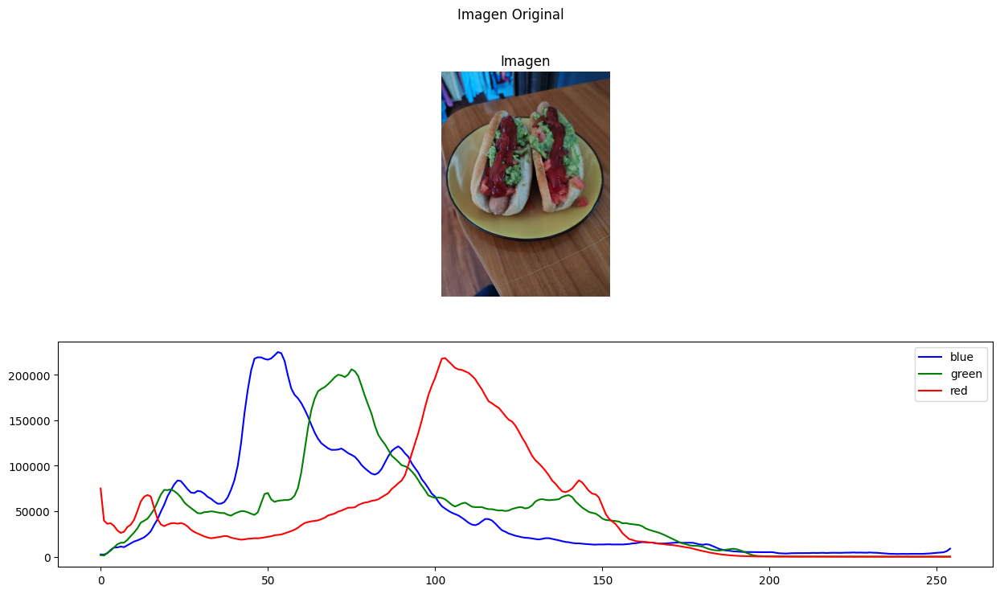

In [18]:
img = cv2.imread("./sim_data-master/images/taller/CompletoSupremo.jpg")
blue, green, red = cv2.split(img)
plot_hist_img(cv2.merge([red, green, blue]),"Imagen Original")

### Hard Threshold

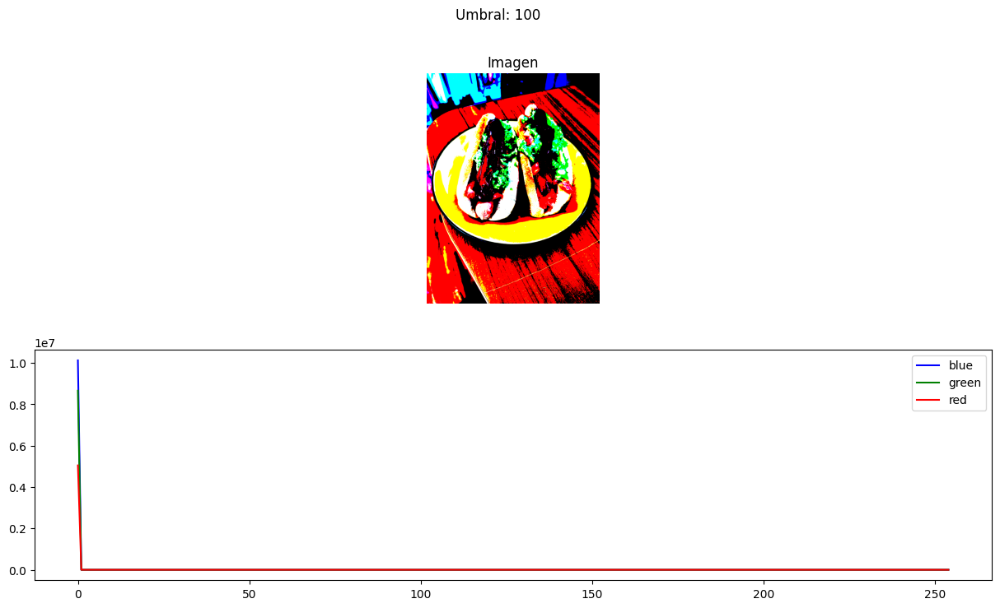

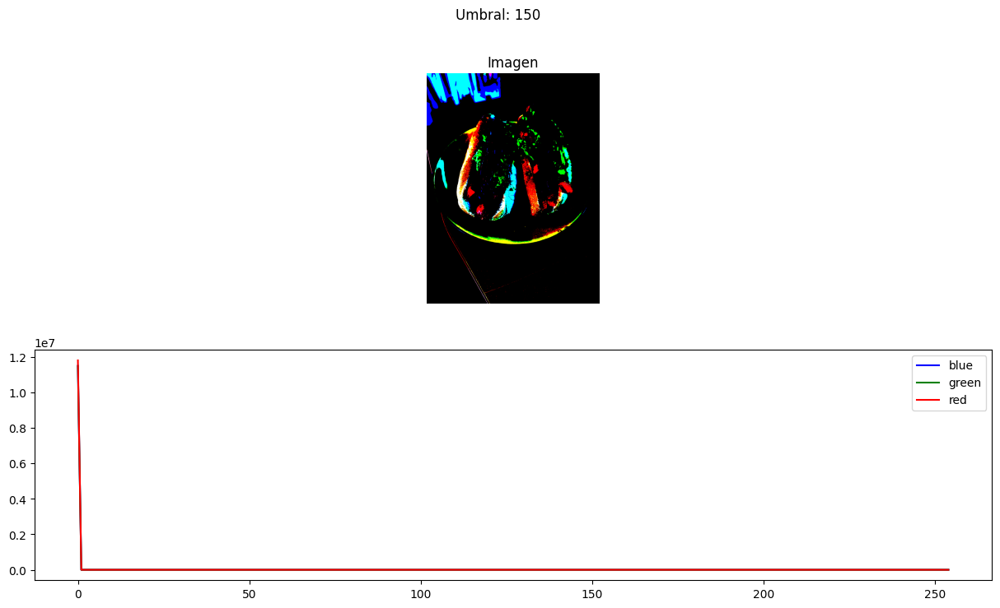

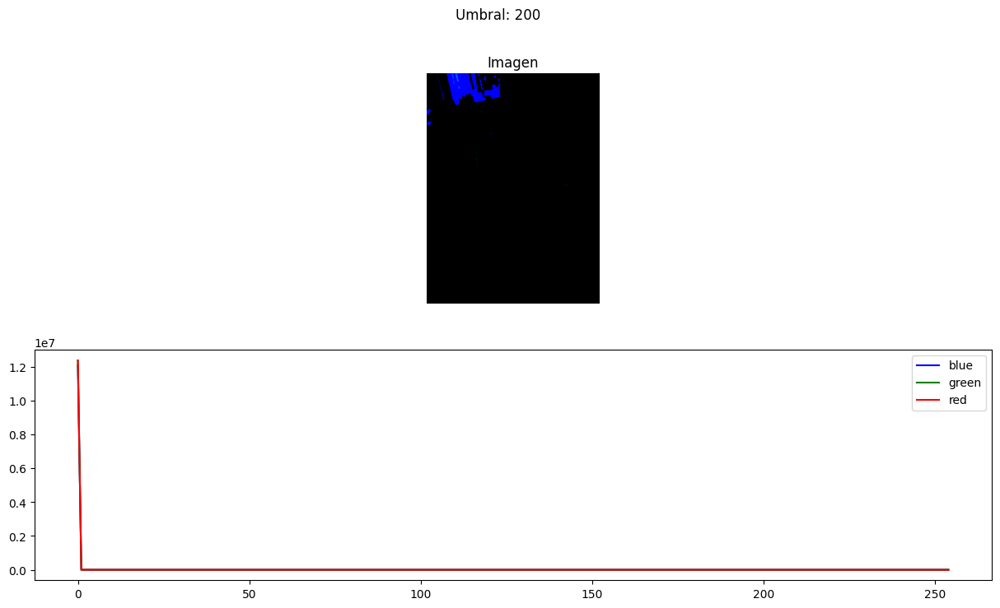

In [19]:
umbrales_hard = [100, 150, 200]

for umbral in umbrales_hard:
    binarios_hard = bin_canales_RGB(red, green, blue,umbral)
    plot_hist_img(cv2.merge(binarios_hard),f'Umbral: {umbral}')





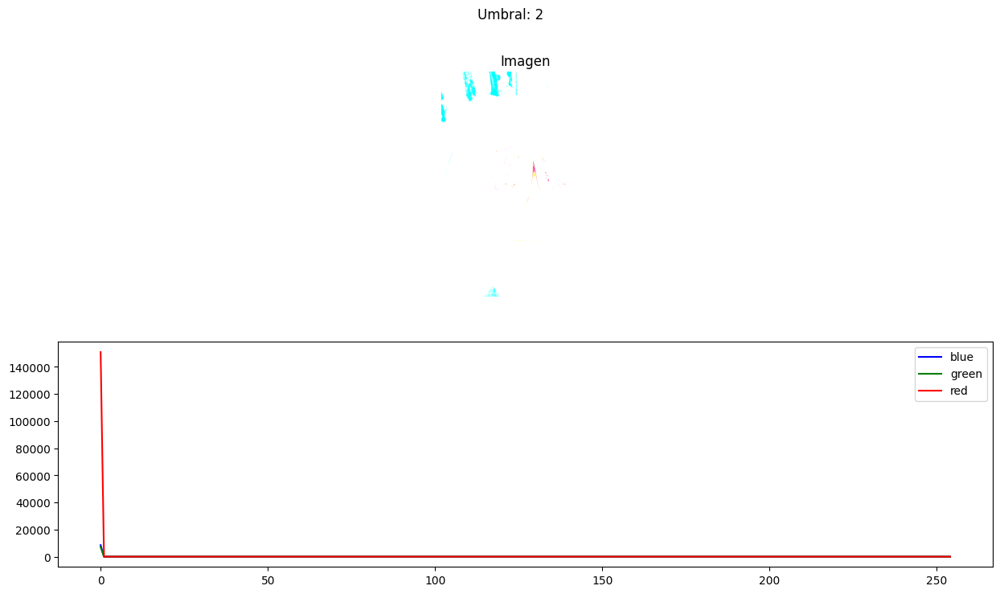

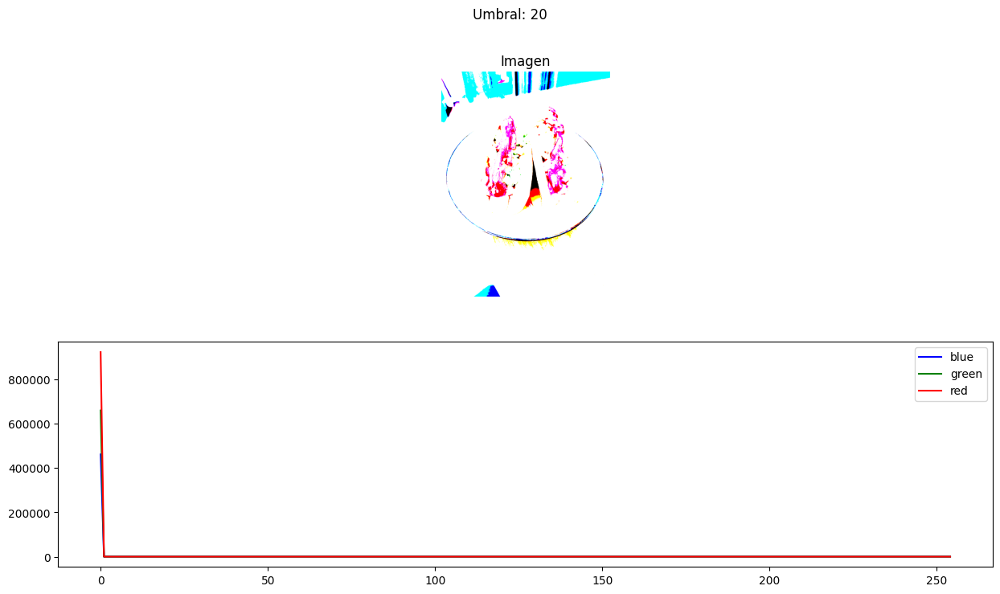

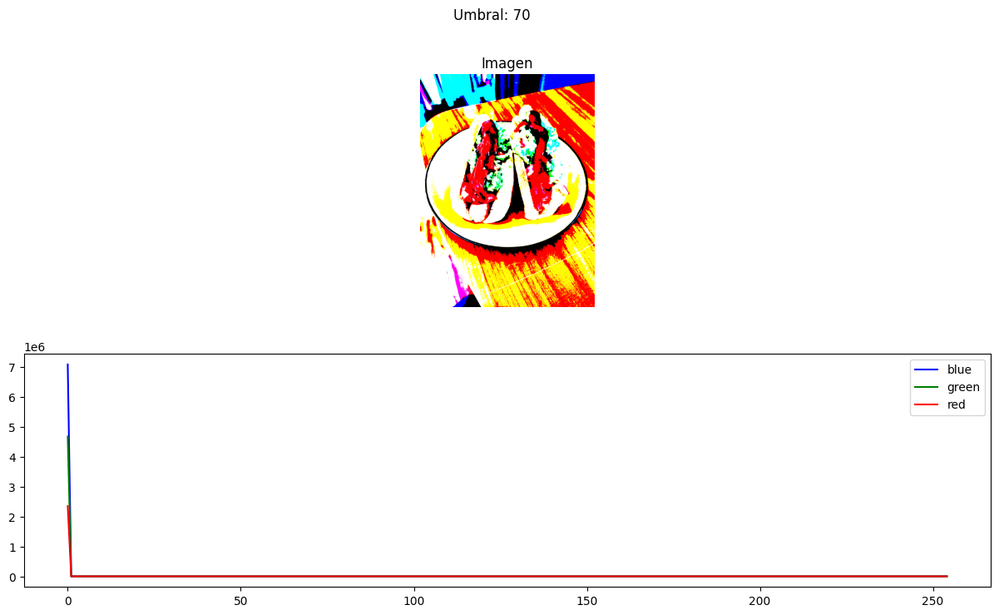

In [20]:
umbrales_hard = [2,20,70]

for umbral in umbrales_hard:
    binarios_hard = bin_canales_RGB(red, green, blue,umbral)
    plot_hist_img(cv2.merge(binarios_hard),f'Umbral: {umbral}')





## 10.	Aplicar los siguientes filtros a una imagen en escala de grises usando convolución.

### Filtros


In [27]:
Identity_kernel=np.array([[0, 0, 0],
                     [0, 1, 0],
                     [0, 0, 0]])
EdgeDetection =np.array([[-1, -1, -1],
                    [-1, 8, -1],
                    [-1, -1, -1]])
Shapen_Kernel=np.array([[0, -1, 0],
                    [-1, 5, -1],
                    [0, -1, 0]])
BOX_blur=(1 / 9.0) * np.array([[1, 1, 1],
                                [1, 1, 1],
                                [1, 1, 1]])

Gaussean_blur_Kernel=(1 / 256.0) * np.array([[1, 4, 6, 4, 1],
                                   [4, 16, 24, 16, 4],
                                   [6, 24, 36, 24, 6],
                                   [4, 16, 24, 16, 4],
                                   [1, 4, 6, 4, 1]])
kernels=[Identity_kernel,EdgeDetection,Shapen_Kernel,BOX_blur,Gaussean_blur_Kernel]
kernels_names =["Identity","Edge Detection","Shapen Kernel", "Box blur","Gaussean blur"]


In [28]:
def filter_show(img, nombre):
    plt.figure(figsize=(15, 10))  # Tamaño de la imagen
    plt.subplot(2, 3, 1)
    plt.imshow(img, cmap="gray")
    plt.axis("off")
    plt.title("Original")

    plt.suptitle(nombre)

    for e in range(len(kernels)):
        image_sharp = cv2.filter2D(img, -1, kernels[e])
        plt.subplot(2, 3, e + 2)  
        plt.imshow(image_sharp, cmap="gray")
        plt.axis("off")
        plt.title(kernels_names[e])

    plt.show()

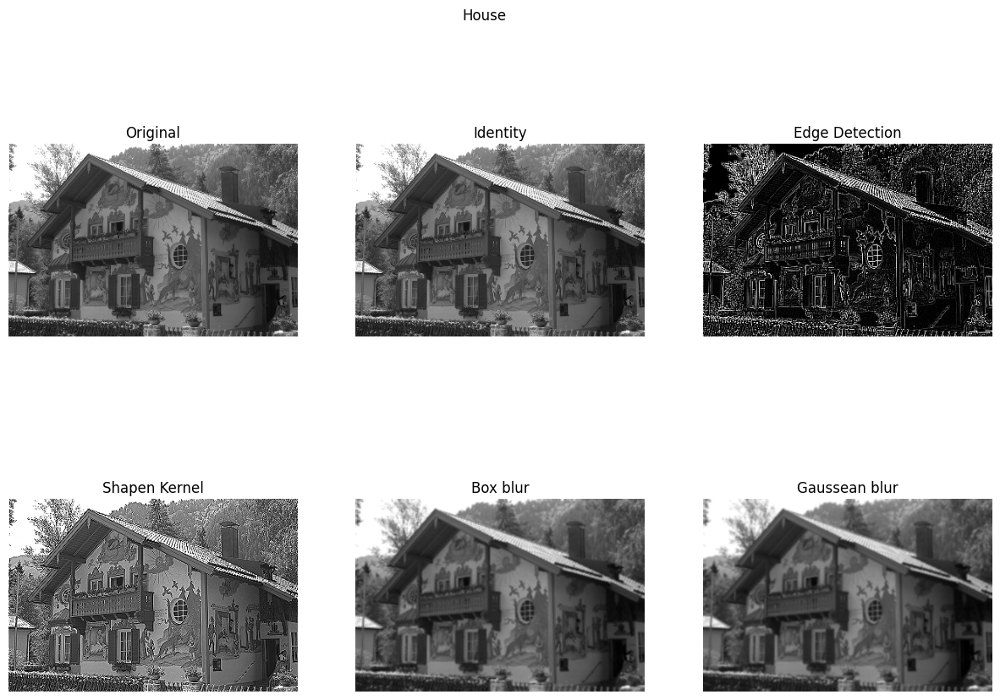

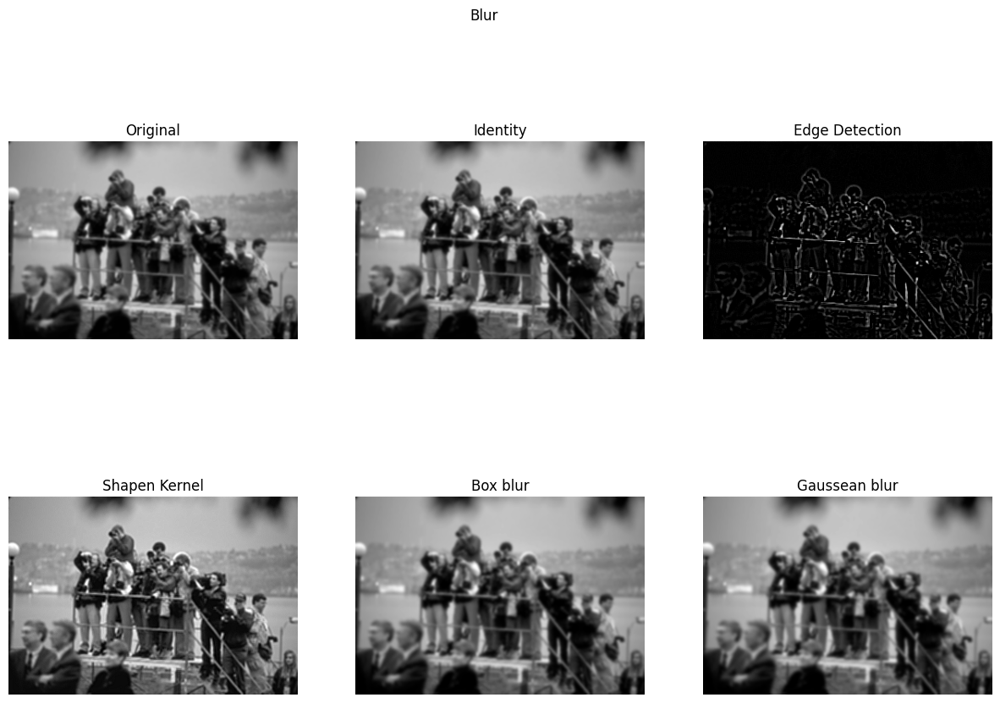

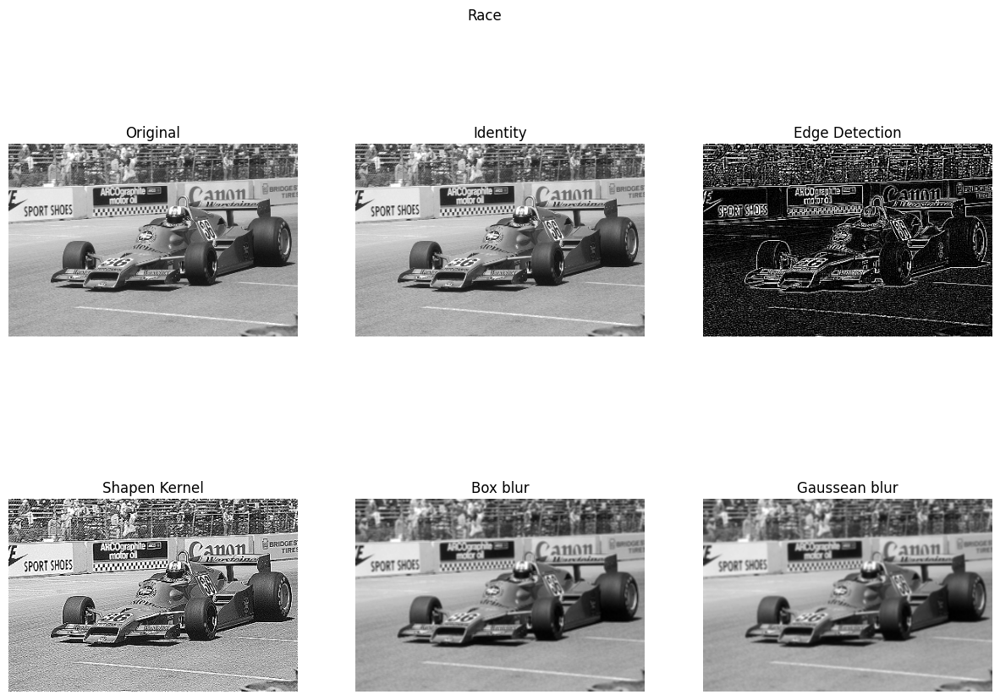

In [29]:
filter_show(house,"House")
filter_show(blur,"Blur")
filter_show(race,"Race")

## 11.	A una imagen en escala de grises, ponerle ruido “salt and pepper”, y probar los filtros usados en el literal 10.

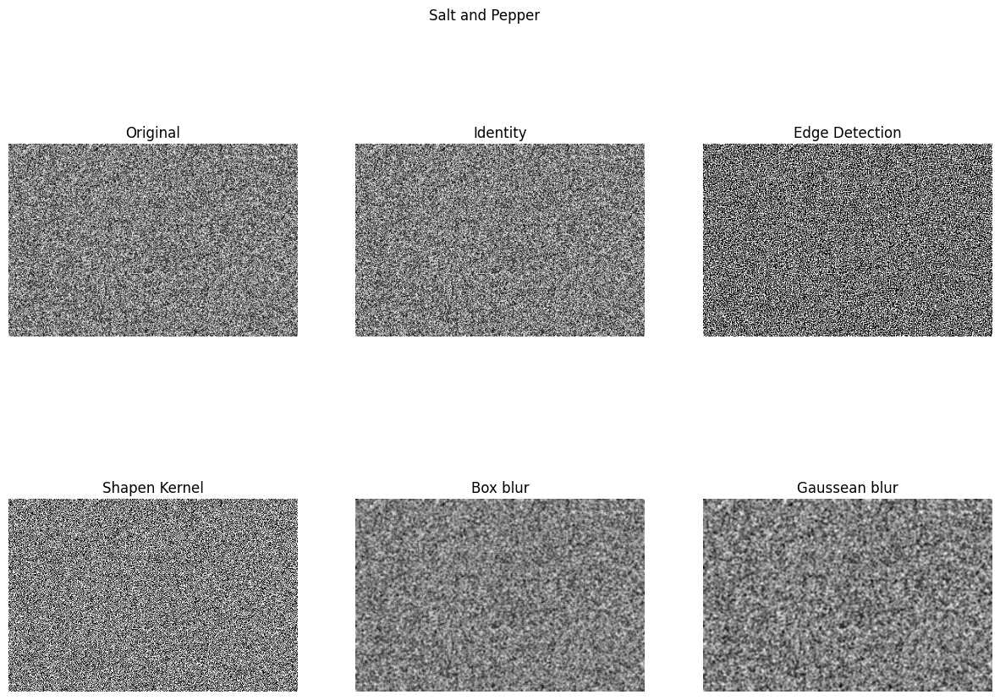

In [102]:
# Agregar ruido salt and pepper a la imagen
noise_img = race.copy()
cv2.randu(noise_img, 0, 255)
salt_vs_pepper = 0.5
amount = 0.02
num_salt = np.ceil(amount * noise_img.size * salt_vs_pepper)
coords = [np.random.randint(0, noise_img.shape[i], int(num_salt))
          for i in range(noise_img.ndim)]
noise_img[tuple(coords)] = 255

num_pepper = np.ceil(amount * noise_img.size * (1.0 - salt_vs_pepper))
coords = [np.random.randint(0, noise_img.shape[i], int(num_pepper))
          for i in range(noise_img.ndim)]
noise_img[tuple(coords)] = 0


# Mostrar los filtros aplicados a la imagen con Salt and Pepper
filter_show(noise_img,"Salt and Pepper")


## 12.	Usar un filtro pasa altos, y un filtro pasa bajos sobre la imagen en escala de grises, y mostrar ambos resultados. Explicar.

Crearemos 3 funciones, donde una será para el filtro pasa altos, pasa bajos y desplegar los filtros efectuados.

En este código, se utiliza el filtro Laplaciano como filtro pasa altos. El cual nos permitira ver bordes y otras características.

Para los filtros pasa bajos, se usara una matriz 5x5 con valores pequeños, donde se verá un efecto de suavizado, reduciendo el contraste entre los píxeles adyacentes y eliminando el ruido de alta frecuencia.

In [32]:
def apply_high_pass_filter(image):
    # Kernel para el filtro pasa altos (laplaciano)
    kernel = np.array([[0, -1, 0],
                       [-1, 4, -1],
                       [0, -1, 0]])

    # Aplicar convolución con el kernel
    filtered_image = cv2.filter2D(image, -1, kernel)
    return filtered_image

def apply_low_pass_filter(image):
    # Kernel para el filtro pasa bajos (suavizado)
    kernel = np.ones((5,5),np.float32)/25

    # Aplicar convolución con el kernel
    filtered_image = cv2.filter2D(image, -1, kernel)
    return filtered_image

def show_filtered_images(image):
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Imagen Original')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    high_pass_image = apply_high_pass_filter(image)
    plt.imshow(high_pass_image, cmap='gray')
    plt.title('Filtro Pasa Altos')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    low_pass_image = apply_low_pass_filter(image)
    plt.imshow(low_pass_image, cmap='gray')
    plt.title('Filtro Pasa Bajos')
    plt.axis('off')

    plt.show()



House:


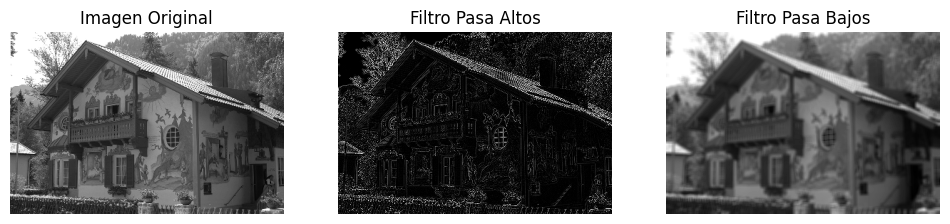

Blur:


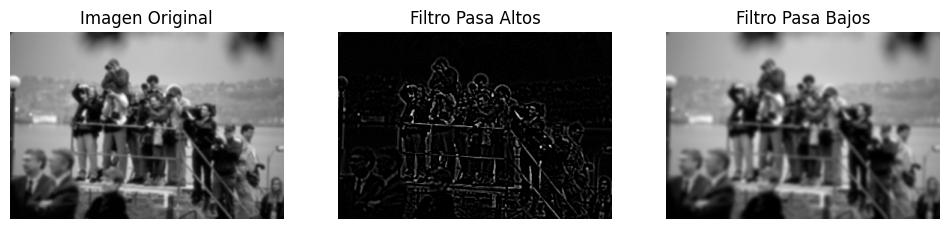

Race:


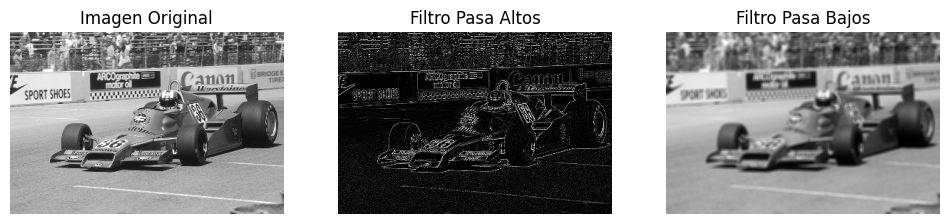

Noise:


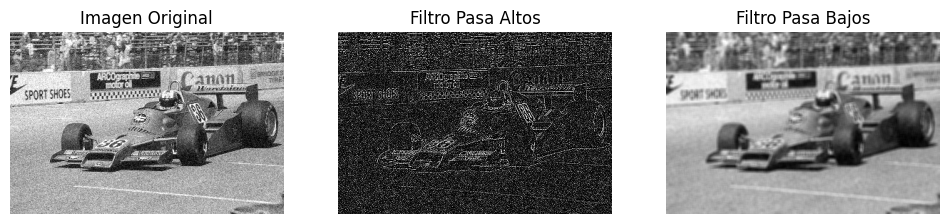

In [74]:
# Mostrar las imágenes filtradas
print("House:")
show_filtered_images(house)
print("Blur:")
show_filtered_images(blur)
print("Race:")
show_filtered_images(race)
print("Noise:")
show_filtered_images(noise)


Podemos identificar características de bordes y detalles con negativos en las imágenes con el filtro pasa altos.

El efecto que produce el filtro pasa bajos es de menor nitidez y mayor suavidad en los detalles.